# Axelrod launches in NYC - Linear Regression Model

In [2]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
import patsy
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import Ridge
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
import plotly.express as px
import plotly.graph_objs as go
from sklearn.metrics import mean_squared_error, mean_absolute_error
import scipy.stats as stats
pd.options.mode.chained_assignment = None
%matplotlib inline
%pylab inline
%config InlineBackend.figure_formats = ['retina']

Populating the interactive namespace from numpy and matplotlib


In [2]:
house_all_areas_df = pd.read_pickle('house_all_areas_df.pickle')

In [3]:
house_all_areas_df.head(2)

,listing_id,price,beds,baths,sqft,property_type,year_built,walk_score,transit_score,num_schools,...,South Beach - Tottenville,Southeast Queens,Stapleton - St. George,Sunset Park,Union Square - Lower East Side,Upper East Side,Upper West Side,Washington Heights - Inwood,Williamsburg - Bushwick,Willowbrook
90,97495573,1650000.0,2.0,3.0,206411.0,Cooperative,1938,98,100,3,...,0,0,0,0,0,0,0,0,0,0
94,89459737,1139000.0,1.0,1.0,1209.0,Apartment,1929,100,100,3,...,0,0,0,0,0,0,0,0,0,0


In [64]:
house_all_areas_df.shape

(192, 49)

## Interlude: Data Transformation on Property Type

In [66]:
# Count what types of property type exists in the dataset
house_all_areas_df['property_type'].value_counts()

Condo                            42
Cooperative                      34
Single Family - Detached         20
Multi Family                     14
Single Family - Semi-Attached    13
MultiFamily                      12
SingleFamily                     10
Single Family Residence          10
Single Family - Attached          9
Two Family - Detached             7
Apartment                         7
Two Family - Semi-Attached        5
Condominium                       3
Stock Cooperative                 3
Townhouse                         2
Two Family - Attached             1
Name: property_type, dtype: int64

In [67]:
# Redefining categorization to a shorter and more actionable list
house_all_areas_df['property_type_adj'] = house_all_areas_df['property_type'].replace({"Condo": "Condominium",
                                                                                       "Single Family - Detached": "Single Family",
                                                                                      "Single Family - Semi-Attached": "Single Family",
                                                                                      "SingleFamily": "Single Family",
                                                                                      "Single Family Residence":"Single Family",
                                                                                      "Single Family - Attached":"Single Family",
                                                                                      "MultiFamily":"Multi Family",
                                                                                      "Two Family - Detached":"Two Family",
                                                                                      "Two Family - Semi-Attached":"Two Family",
                                                                                      "Two Family - Attached":"Two Family"})

In [68]:
house_all_areas_df.columns

Index(['listing_id', 'price', 'beds', 'baths', 'sqft', 'property_type',
       'year_built', 'walk_score', 'transit_score', 'num_schools',
       'avg_school_rating', 'parking_binary', 'pool_binary',
       'city_view_binary', 'water_view_binary', 'park_view_binary',
       'mountain_view_binary', 'address', 'area', 'Bensonhurst - Bay Ridge',
       'Borough Park', 'Canarsie - Flatlands',
       'Central Harlem - Morningside Heights', 'Chelsea - Clinton',
       'Coney Island - Sheepshead Bay', 'Crotona - Tremont',
       'Downtown - Heights - Park Slope', 'East Flatbush - Flatbush',
       'East New York', 'Fordham - Bronx Park', 'Gramercy Park - Murray Hill',
       'Greenpoint', 'Greenwich Village - SoHo', 'High Bridge - Morrisania',
       'Kingsbridge - Riverdale', 'Lower Manhattan', 'Northeast Bronx',
       'Pelham - Throgs Neck', 'Port Richmond', 'South Beach - Tottenville',
       'Southeast Queens', 'Stapleton - St. George', 'Sunset Park',
       'Union Square - Lower East Si

In [69]:
house_all_areas_df.head(3)

,listing_id,price,beds,baths,sqft,property_type,year_built,walk_score,transit_score,num_schools,...,Southeast Queens,Stapleton - St. George,Sunset Park,Union Square - Lower East Side,Upper East Side,Upper West Side,Washington Heights - Inwood,Williamsburg - Bushwick,Willowbrook,property_type_adj
90,97495573,1650000.0,2.0,3.0,206411.0,Cooperative,1938,98,100,3,...,0,0,0,0,0,0,0,0,0,Cooperative
94,89459737,1139000.0,1.0,1.0,1209.0,Apartment,1929,100,100,3,...,0,0,0,0,0,0,0,0,0,Apartment
67,89335782,1299998.0,1.0,2.0,1189.0,Condo,1912,99,100,3,...,0,0,0,0,0,0,0,0,0,Condominium


In [70]:
house_all_areas_df['property_type_adj'].value_counts()

Single Family        62
Condominium          45
Cooperative          34
Multi Family         26
Two Family           13
Apartment             7
Stock Cooperative     3
Townhouse             2
Name: property_type_adj, dtype: int64

In [78]:
# Column property_type_adj transformed in dummy
house_complete_df = pd.concat([house_all_areas_df, pd.get_dummies(house_all_areas_df['property_type_adj'], drop_first = True)], axis=1)

In [79]:
house_complete_df.shape

(192, 57)

In [80]:
house_complete_df.columns

Index(['listing_id', 'price', 'beds', 'baths', 'sqft', 'property_type',
       'year_built', 'walk_score', 'transit_score', 'num_schools',
       'avg_school_rating', 'parking_binary', 'pool_binary',
       'city_view_binary', 'water_view_binary', 'park_view_binary',
       'mountain_view_binary', 'address', 'area', 'Bensonhurst - Bay Ridge',
       'Borough Park', 'Canarsie - Flatlands',
       'Central Harlem - Morningside Heights', 'Chelsea - Clinton',
       'Coney Island - Sheepshead Bay', 'Crotona - Tremont',
       'Downtown - Heights - Park Slope', 'East Flatbush - Flatbush',
       'East New York', 'Fordham - Bronx Park', 'Gramercy Park - Murray Hill',
       'Greenpoint', 'Greenwich Village - SoHo', 'High Bridge - Morrisania',
       'Kingsbridge - Riverdale', 'Lower Manhattan', 'Northeast Bronx',
       'Pelham - Throgs Neck', 'Port Richmond', 'South Beach - Tottenville',
       'Southeast Queens', 'Stapleton - St. George', 'Sunset Park',
       'Union Square - Lower East Si

In [81]:
# Drop redundant columns
house_complete_df = house_complete_df.drop(['property_type_adj','property_type','area','address'], axis = 1)

In [82]:
house_complete_df.shape

(192, 53)

In [83]:
house_complete_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 192 entries, 90 to 47
Data columns (total 53 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   listing_id                            192 non-null    object 
 1   price                                 192 non-null    float64
 2   beds                                  192 non-null    float64
 3   baths                                 192 non-null    float64
 4   sqft                                  192 non-null    float64
 5   year_built                            192 non-null    int64  
 6   walk_score                            192 non-null    int64  
 7   transit_score                         192 non-null    int64  
 8   num_schools                           192 non-null    int64  
 9   avg_school_rating                     192 non-null    float64
 10  parking_binary                        192 non-null    int64  
 11  pool_binary        

## Exploratory Data Analysis

In [84]:
house_complete_df.corr()

,price,beds,baths,sqft,year_built,walk_score,transit_score,num_schools,avg_school_rating,parking_binary,...,Washington Heights - Inwood,Williamsburg - Bushwick,Willowbrook,Condominium,Cooperative,Multi Family,Single Family,Stock Cooperative,Townhouse,Two Family
price,1.000000,0.265270,0.423562,0.040798,-0.007173,0.344402,0.427354,-0.118777,0.220827,-0.456621,...,-0.071500,0.046887,-0.118289,0.351804,-0.034321,0.055326,-0.252123,-0.108525,0.114650,-0.070734
beds,0.265270,1.000000,0.652804,-0.156935,0.047386,-0.219555,-0.207215,-0.064815,-0.169026,0.163321,...,-0.131053,-0.054450,0.029021,-0.287372,-0.322655,0.666299,0.025065,-0.088260,-0.002178,0.173828
baths,0.423562,0.652804,1.000000,-0.121485,0.211420,-0.174219,-0.134950,-0.118424,-0.112781,0.052632,...,-0.133403,-0.072171,0.025721,-0.026493,-0.297217,0.359993,0.005114,-0.133403,-0.035706,0.186192
sqft,0.040798,-0.156935,-0.121485,1.000000,-0.080481,0.176051,0.212464,-0.065611,0.065781,-0.141300,...,0.124180,-0.023815,-0.053270,-0.124968,0.469316,-0.077627,-0.151772,-0.029451,-0.023018,-0.056843
year_built,-0.007173,0.047386,0.211420,-0.080481,1.000000,-0.258740,-0.212533,0.031062,0.102959,0.171669,...,-0.092711,0.008596,0.087816,0.250428,-0.313402,-0.073282,0.003364,-0.053986,-0.150395,0.181341
walk_score,0.344402,-0.219555,-0.174219,0.176051,-0.258740,1.000000,0.828738,-0.198695,0.027126,-0.595698,...,0.082836,0.064974,-0.334751,0.409606,0.300379,-0.058084,-0.476527,0.005590,0.092288,-0.292416
transit_score,0.427354,-0.207215,-0.134950,0.212464,-0.212533,0.828738,1.000000,-0.268072,0.092949,-0.664478,...,0.129345,0.068350,-0.329688,0.471789,0.342056,0.012835,-0.590123,0.066632,0.084199,-0.308294
num_schools,-0.118777,-0.064815,-0.118424,-0.065611,0.031062,-0.198695,-0.268072,1.000000,-0.001901,0.242416,...,-0.184695,-0.041842,0.160318,-0.160593,-0.160311,-0.129188,0.307671,-0.095819,0.066721,0.131384
avg_school_rating,0.220827,-0.169026,-0.112781,0.065781,0.102959,0.027126,0.092949,-0.001901,1.000000,-0.143345,...,0.044726,-0.130080,-0.043417,0.201738,0.154347,-0.200400,-0.165777,-0.064320,0.014222,0.039600
parking_binary,-0.456621,0.163321,0.052632,-0.141300,0.171669,-0.595698,-0.664478,0.242416,-0.143345,1.000000,...,-0.052678,-0.111536,0.226768,-0.428749,-0.312618,0.058553,0.501126,-0.052678,-0.111536,0.247896


In [85]:
house_complete_df['park_view_binary'].isna().sum()

0

In [86]:
house_complete_df['mountain_view_binary'].isna().sum()

0

In [87]:
house_complete_df['park_view_binary'].value_counts()

0    192
Name: park_view_binary, dtype: int64

In [88]:
house_complete_df['mountain_view_binary'].value_counts()

0    192
Name: mountain_view_binary, dtype: int64

The features park_view and mountain_view show NaN in the correlation matrix because they do not vary - all of the 192 observations included in the dataframe have a park_view and mountain_view of 0. By adding more observation, through additional scraping, I hope to add variability to these features. If not, I will likely drop them because they do not add any valuable information to predicting the target or interpreting the regression model.

In [97]:
# Created a new df where we drop columns that at this stage are not meaningful features
house_lean_df = house_complete_df.drop(['park_view_binary','mountain_view_binary'], 1)

In [98]:
house_lean_df.shape

(192, 51)

In [99]:
house_lean_df.columns

Index(['listing_id', 'price', 'beds', 'baths', 'sqft', 'year_built',
       'walk_score', 'transit_score', 'num_schools', 'avg_school_rating',
       'parking_binary', 'pool_binary', 'city_view_binary',
       'water_view_binary', 'Bensonhurst - Bay Ridge', 'Borough Park',
       'Canarsie - Flatlands', 'Central Harlem - Morningside Heights',
       'Chelsea - Clinton', 'Coney Island - Sheepshead Bay',
       'Crotona - Tremont', 'Downtown - Heights - Park Slope',
       'East Flatbush - Flatbush', 'East New York', 'Fordham - Bronx Park',
       'Gramercy Park - Murray Hill', 'Greenpoint', 'Greenwich Village - SoHo',
       'High Bridge - Morrisania', 'Kingsbridge - Riverdale',
       'Lower Manhattan', 'Northeast Bronx', 'Pelham - Throgs Neck',
       'Port Richmond', 'South Beach - Tottenville', 'Southeast Queens',
       'Stapleton - St. George', 'Sunset Park',
       'Union Square - Lower East Side', 'Upper East Side', 'Upper West Side',
       'Washington Heights - Inwood', 'Willi

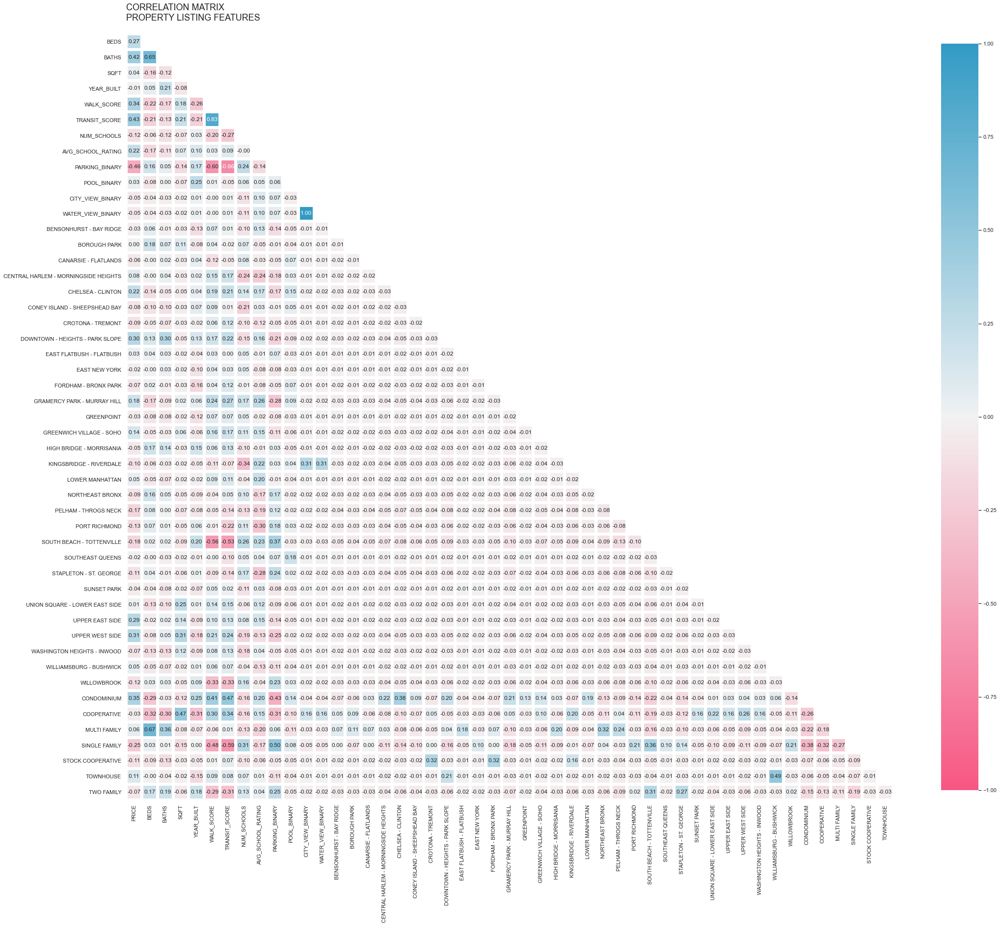

In [100]:
# Create correlation matrix of full dataframe

# correlation df
house_lean_df_corr = house_lean_df.corr()

# mask
mask = np.triu(np.ones_like(house_lean_df_corr, dtype=np.bool))

# adjust mask and df
mask = mask[1:, :-1]
corr = house_lean_df_corr.iloc[1:,:-1].copy()

# color map
cmap = sns.diverging_palette(0, 230, 90, 60, as_cmap=True)

# plot heatmap
sns.set(rc={"figure.figsize": (35,35)})
sns.set_style("white")
house_corr_matrix = sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", 
                                linewidths=5, cmap=cmap, vmin=-1, vmax=1, 
                                cbar_kws={"shrink": .8}, square=True)

# ticks
yticks = [i.upper() for i in corr.index]
xticks = [i.upper() for i in corr.columns];

plt.yticks(plt.yticks()[0], labels=yticks, rotation=0)
plt.xticks(plt.xticks()[0], labels=xticks)

# title
title = 'CORRELATION MATRIX\nPROPERTY LISTING FEATURES\n'
plt.title(title, loc='left', fontsize=18);

In [101]:
# Plot all of the variable-to-variable relations as scatterplots
house_pairplot = sns.pairplot(house_lean_df);

These two visualizations are quite complex, hence impeding a clear interpretation. I will recreate them based on a smaller amount of features.

In [102]:
house_lean_df.columns

Index(['listing_id', 'price', 'beds', 'baths', 'sqft', 'year_built',
       'walk_score', 'transit_score', 'num_schools', 'avg_school_rating',
       'parking_binary', 'pool_binary', 'city_view_binary',
       'water_view_binary', 'Bensonhurst - Bay Ridge', 'Borough Park',
       'Canarsie - Flatlands', 'Central Harlem - Morningside Heights',
       'Chelsea - Clinton', 'Coney Island - Sheepshead Bay',
       'Crotona - Tremont', 'Downtown - Heights - Park Slope',
       'East Flatbush - Flatbush', 'East New York', 'Fordham - Bronx Park',
       'Gramercy Park - Murray Hill', 'Greenpoint', 'Greenwich Village - SoHo',
       'High Bridge - Morrisania', 'Kingsbridge - Riverdale',
       'Lower Manhattan', 'Northeast Bronx', 'Pelham - Throgs Neck',
       'Port Richmond', 'South Beach - Tottenville', 'Southeast Queens',
       'Stapleton - St. George', 'Sunset Park',
       'Union Square - Lower East Side', 'Upper East Side', 'Upper West Side',
       'Washington Heights - Inwood', 'Willi

In [103]:
# Create smaller dataframe, including less features then before
house_smaller_df = house_lean_df.loc[:,['listing_id', 'price', 'beds', 'baths', 'sqft', 'year_built',
                                       'walk_score', 'transit_score', 'num_schools', 'avg_school_rating',
                                       'parking_binary', 'pool_binary', 'city_view_binary',
                                       'water_view_binary']]

In [104]:
house_smaller_df.head(2)

,listing_id,price,beds,baths,sqft,year_built,walk_score,transit_score,num_schools,avg_school_rating,parking_binary,pool_binary,city_view_binary,water_view_binary
90,97495573,1650000.0,2.0,3.0,206411.0,1938,98,100,3,7.333333,0,0,0,0
94,89459737,1139000.0,1.0,1.0,1209.0,1929,100,100,3,7.333333,0,0,0,0


In [111]:
house_smaller_df_cols = house_smaller_df.columns.tolist()

In [112]:
house_smaller_df_cols

['listing_id',
 'price',
 'beds',
 'baths',
 'sqft',
 'year_built',
 'walk_score',
 'transit_score',
 'num_schools',
 'avg_school_rating',
 'parking_binary',
 'pool_binary',
 'city_view_binary',
 'water_view_binary']

In [116]:
house_smaller_df_cols[-1::-1]

['water_view_binary',
 'city_view_binary',
 'pool_binary',
 'parking_binary',
 'avg_school_rating',
 'num_schools',
 'transit_score',
 'walk_score',
 'year_built',
 'sqft',
 'baths',
 'beds',
 'price',
 'listing_id']

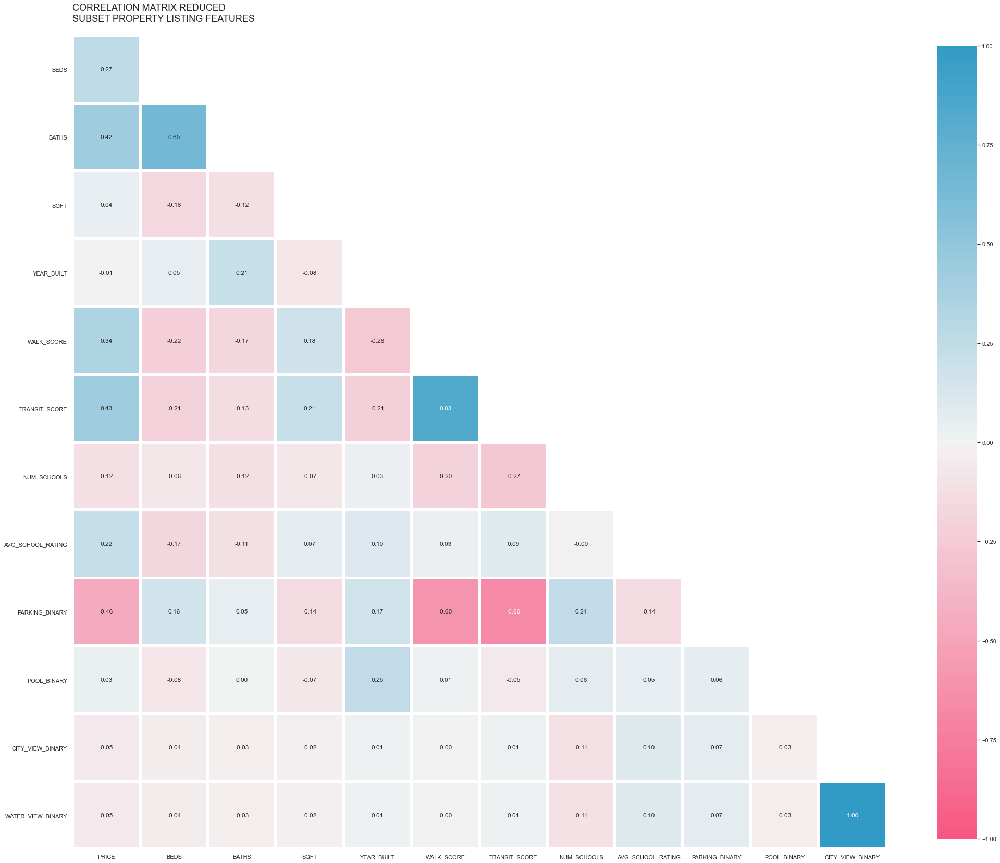

In [131]:
# Redraw correlation matrix

# correlation df
house_smaller_corr = house_smaller_df.corr()

# mask
mask_smaller = np.triu(np.ones_like(house_smaller_corr, dtype=np.bool))

# adjust mask and df
mask_smaller = mask_smaller[1:,:-1]
corr_smaller = house_smaller_corr.iloc[1:,:-1].copy()

# color map
cmap = sns.diverging_palette(0, 230, 90, 60, as_cmap=True)

# plot heatmap
sns.set(rc={"figure.figsize": (35,35)})
sns.set_style("white")
house_smaller_corr_matrix = sns.heatmap(corr_smaller, mask=mask_smaller, annot=True, fmt=".2f", 
                                linewidths=5, cmap=cmap, vmin=-1, vmax=1, 
                                cbar_kws={"shrink": .8}, square=True)

# ticks
yticks = [i.upper() for i in corr_smaller.index]
xticks = [i.upper() for i in corr_smaller.columns];

plt.yticks(plt.yticks()[0], labels=yticks, rotation=0)
plt.xticks(plt.xticks()[0], labels=xticks)

# title
title = 'CORRELATION MATRIX REDUCED\nSUBSET PROPERTY LISTING FEATURES\n'
plt.title(title, loc='left', fontsize=18);

# save to file
fig = house_smaller_corr_matrix.get_figure()
fig.savefig("/Users/valentinarizzati/Desktop/images/corr_matrix_reduced.png");

In this correlation matrix, price - the target variable - presents the highest **positive** correlations with: 
- beds and baths - which are quite highly correlated with each other
- walk_score and transit_score - which are quite highly correlated with each other
- average_school_rating
All these positive correlations make sense as we would expect the price to be positively impacted by the above mentioned variables.

Instead, price presents a negative correlation with:
- parking_binary - which is in a way counterintuitive, as we would expect it to be positively correlated with price instead

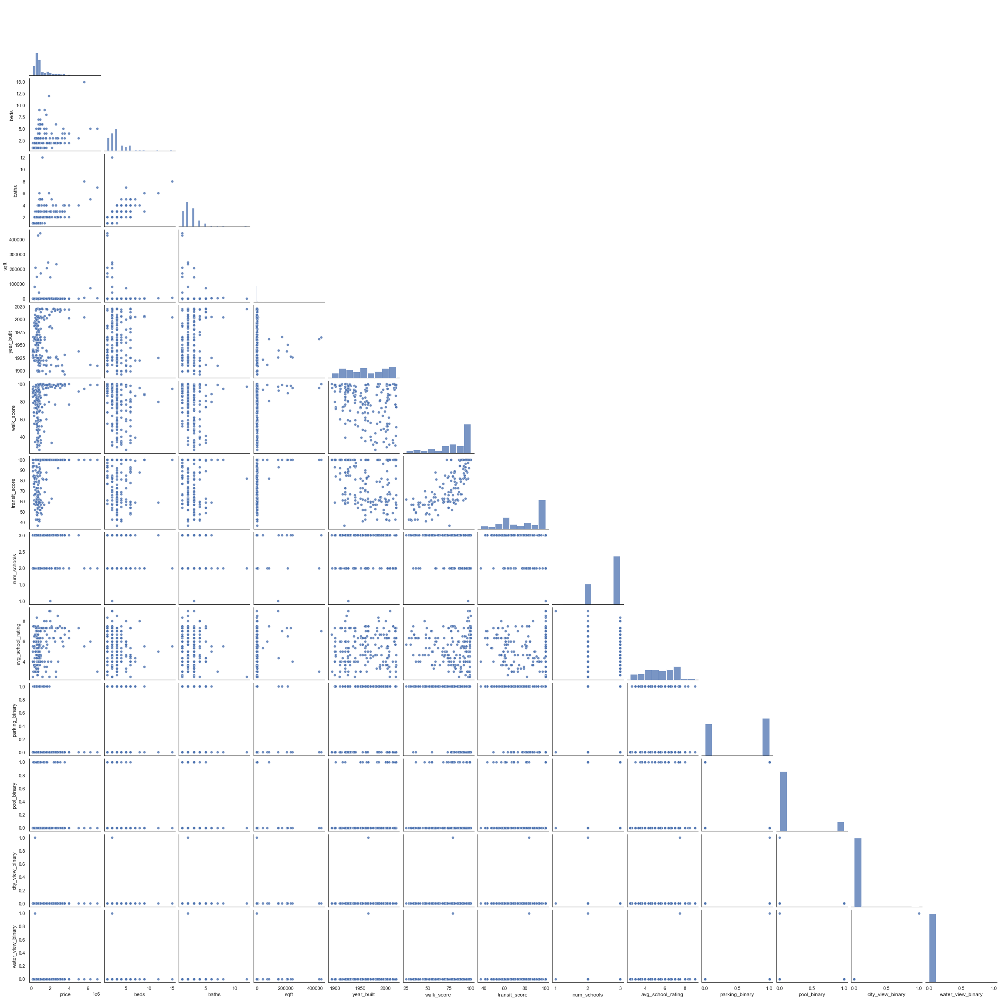

In [138]:
# Redraw pairplot
sns.set(rc={"figure.figsize": (40,40)})
sns.set_style("white")
house_smaller_pairplot = sns.pairplot(house_smaller_df,plot_kws={'alpha':0.8},corner=True);

# title
#title = 'PAIRPLOT REDUCED\nSUBSET PROPERTY LISTING FEATURES\n'
#plt.title(title, loc='center', fontsize=18);

# save to file
house_smaller_pairplot.savefig("/Users/valentinarizzati/Desktop/images/pairplot_reduced.png");

LinAlgError: singular matrix

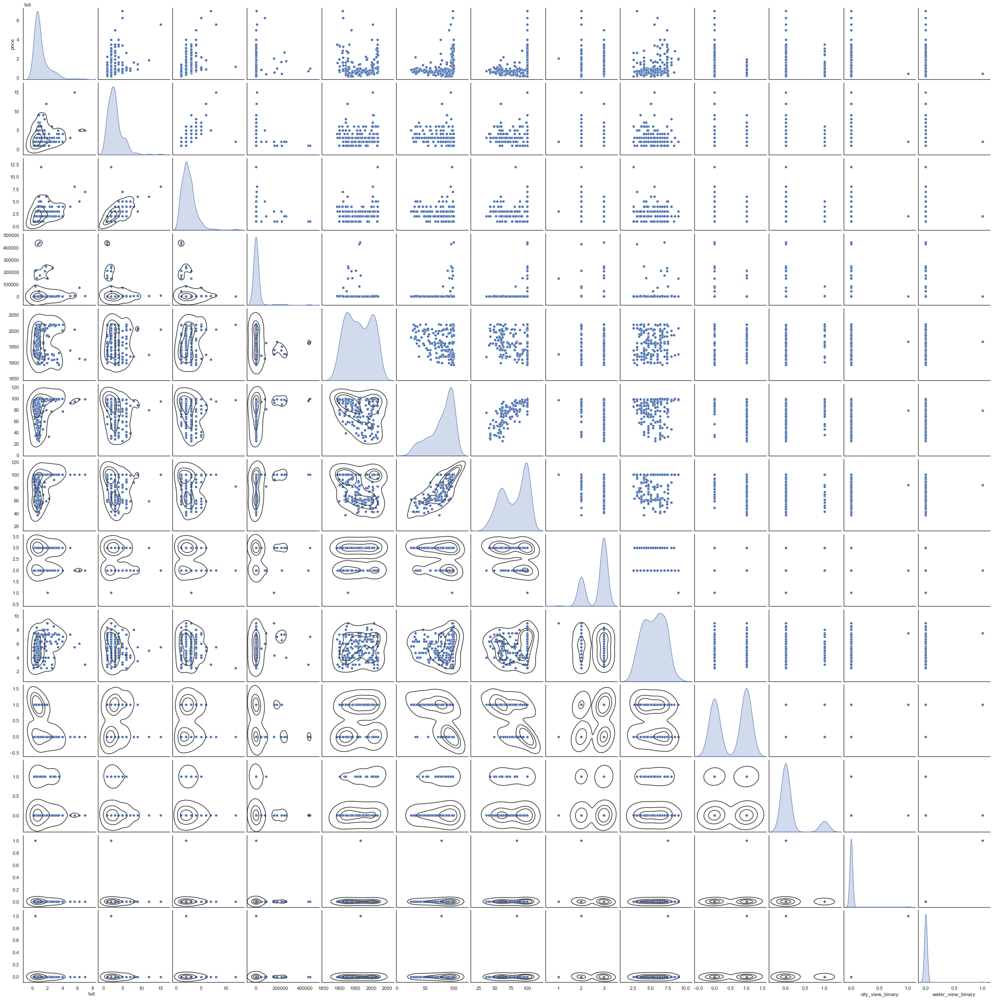

In [125]:
# Draw Kdeplot
sns.set(rc={"figure.figsize": (40,40)})
sns.set_style("white")
house_smaller_kdeplot = sns.pairplot(house_smaller_df, diag_kind="kde")
house_smaller_kdeplot.map_lower(sns.kdeplot, levels=4, color=".2");

## Baseline the model

In [126]:
# Fit a simple model first and do not include property type and area dummies
features_simple = house_lean_df[['beds', 'baths', 'sqft', 'year_built',
                               'walk_score', 'transit_score', 'num_schools', 'avg_school_rating',
                               'parking_binary', 'pool_binary', 'city_view_binary',
                               'water_view_binary']]
target = house_lean_df['price']

In [127]:
# Fit a linear regression model on this preliminary data set
house_lr = LinearRegression()
house_lr.fit(features_simple, target)

LinearRegression()

In [128]:
# Check the R-squared value of the model on this preliminary data set
house_lr.score(features_simple, target)

0.5315856144731066

In [129]:
house_lr.coef_

array([ 8.41924350e+04,  3.34233976e+05, -1.88852738e-02, -7.12413410e+02,
        2.73604440e+03,  1.71625975e+04,  2.07489510e+05,  1.64252974e+05,
       -5.64128726e+05,  2.06662511e+05, -2.48030370e+05, -2.48030370e+05])

## Model with all the data

In [160]:
house_all_areas_df_2 = pd.read_pickle('house_all_areas_df_2.pickle')

In [161]:
house_all_areas_df_2.shape

(668, 61)

In [162]:
house_complete_df.shape

(192, 53)

In [163]:
house_complete_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 192 entries, 90 to 47
Data columns (total 53 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   listing_id                            192 non-null    object 
 1   price                                 192 non-null    float64
 2   beds                                  192 non-null    float64
 3   baths                                 192 non-null    float64
 4   sqft                                  192 non-null    float64
 5   year_built                            192 non-null    int64  
 6   walk_score                            192 non-null    int64  
 7   transit_score                         192 non-null    int64  
 8   num_schools                           192 non-null    int64  
 9   avg_school_rating                     192 non-null    float64
 10  parking_binary                        192 non-null    int64  
 11  pool_binary        

In [164]:
house_all_areas_df_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 668 entries, 163 to 525
Data columns (total 61 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   listing_id                            668 non-null    object 
 1   price                                 668 non-null    float64
 2   beds                                  668 non-null    float64
 3   baths                                 668 non-null    float64
 4   sqft                                  668 non-null    float64
 5   property_type                         668 non-null    object 
 6   property_type_adj                     668 non-null    object 
 7   address                               668 non-null    object 
 8   area                                  668 non-null    object 
 9   year_built                            668 non-null    int64  
 10  walk_score                            668 non-null    int64  
 11  transit_score    

In [165]:
# Drop redundant columns from house_all_areas_df_2
house_all_areas_df_2 = house_all_areas_df_2.drop(['property_type','area','address'], axis = 1)

In [166]:
house_all_areas_df_2.shape

(668, 56)

In [167]:
house_all_areas_df_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 668 entries, 163 to 525
Data columns (total 56 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   listing_id                            668 non-null    object 
 1   price                                 668 non-null    float64
 2   beds                                  668 non-null    float64
 3   baths                                 668 non-null    float64
 4   sqft                                  668 non-null    float64
 5   property_type_adj                     668 non-null    object 
 6   year_built                            668 non-null    int64  
 7   walk_score                            668 non-null    int64  
 8   transit_score                         668 non-null    int64  
 9   num_schools                           668 non-null    int64  
 10  avg_school_rating                     668 non-null    float64
 11  parking_binary   

In [168]:
# Drop property_type_adj
house_all_areas_df_2 = house_all_areas_df_2.drop(['property_type_adj'], axis = 1)

In [169]:
house_all_areas_df_2.shape

(668, 55)

The house_all_areas_df_2 df has two more property types. Hence it has two more columns than house_complete_df.

In [170]:
combined_listings = house_complete_df.merge(house_all_areas_df_2, how = 'outer')

In [171]:
combined_listings.shape

(838, 55)

In [172]:
combined_listings['listing_id'].value_counts()

32292896      2
62648349      2
30743491      2
29847699      2
89075555      2
             ..
30566097      1
245015854     1
81854761      1
2094637426    1
30688879      1
Name: listing_id, Length: 807, dtype: int64

In [200]:
# Drop duplicates
combined_listings.sort_values(["listing_id"], inplace=True, ascending=False)
combined_listings.drop_duplicates(subset=["listing_id"], inplace=True)

In [202]:
combined_listings.shape

(807, 55)

In [201]:
combined_listings.isnull().values.any()

True

In [203]:
combined_listings.isna().sum()

listing_id                                0
price                                     0
beds                                      0
baths                                     0
sqft                                      0
year_built                                0
walk_score                                0
transit_score                             0
num_schools                               0
avg_school_rating                         0
parking_binary                            0
pool_binary                               0
city_view_binary                          0
water_view_binary                         0
park_view_binary                          0
mountain_view_binary                      0
Bensonhurst - Bay Ridge                   0
Borough Park                              0
Canarsie - Flatlands                      0
Central Harlem - Morningside Heights      0
Chelsea - Clinton                         0
Coney Island - Sheepshead Bay             0
Crotona - Tremont               

In [205]:
# Replace na with 0 since those listings are not bungalows 
combined_listings['Bungalow'] = combined_listings['Bungalow'].fillna(0)

In [206]:
# Replace na with 0 since those listings are not mixed use
combined_listings['Mixed Use'] = combined_listings['Mixed Use'].fillna(0)

In [208]:
# Double checking that we only have 1 Bungalow as we did in the source df
combined_listings['Bungalow'].value_counts()

0.0    806
1.0      1
Name: Bungalow, dtype: int64

In [209]:
# Double checking that we only have 1 Mixed Use as we did in the source df
combined_listings['Mixed Use'].value_counts()

0.0    806
1.0      1
Name: Mixed Use, dtype: int64

In [210]:
combined_listings.isnull().values.any()

False

## EDA on complete dataframe

### Additional Data Cleaning

In [233]:
# Count values for every variable in the model
for i in combined_listings.columns:
    x = combined_listings[i].value_counts()
    print("Column name is:",i,"and it value is:\n",x)

Column name is: listing_id and it value is:
 244596933     1
2071108435    1
32346094      1
244800569     1
217911520     1
             ..
30767406      1
29816505      1
32349544      1
55500717      1
30688879      1
Name: listing_id, Length: 807, dtype: int64
Column name is: price and it value is:
 599000.0     13
799000.0     12
899000.0     11
1395000.0     9
649000.0      9
             ..
774888.0      1
329900.0      1
628000.0      1
545000.0      1
419000.0      1
Name: price, Length: 439, dtype: int64
Column name is: beds and it value is:
 3.0     236
2.0     205
1.0     166
4.0      63
5.0      57
6.0      41
8.0      15
7.0       9
9.0       8
15.0      2
10.0      2
78.0      1
12.0      1
16.0      1
Name: beds, dtype: int64
Column name is: baths and it value is:
 2.0     271
1.0     237
3.0     193
4.0      69
5.0      17
6.0       9
7.0       5
8.0       3
9.0       1
12.0      1
59.0      1
Name: baths, dtype: int64
Column name is: sqft and it value is:
 800.0     1

The three **property_type** variables *Mixed Use*, *Bungalow* and *Townhouse* are binary variables with very few 1s. I will group them in a new category called *Other_prop_type*.

In [259]:
# Create conditions for feature engineering on property type
prop_type_conditions = [
    combined_listings['Mixed Use'] == 1,
    combined_listings['Bungalow'] == 1,
    combined_listings['Townhouse'] == 1,
]

# Create outputs for feature engineering on property type
prop_type_outputs = [1,1,1]

# Create new column 'Other Property Types'
combined_listings['Other Property Types'] = np.select(prop_type_conditions, prop_type_outputs, 0)

In [260]:
# Check new col is created and has 11 1s (sum of the 1s in the Mixed Use, Bungalow and Townhouse categories)
combined_listings['Other Property Types'].value_counts()

0    796
1     11
Name: Other Property Types, dtype: int64

In [262]:
# Mask the other property types
other_types_mask = (combined_listings['Other Property Types']==1)
combined_listings[other_types_mask]

,listing_id,price,beds,baths,sqft,year_built,walk_score,transit_score,num_schools,avg_school_rating,...,Condominium,Cooperative,Multi Family,Single Family,Stock Cooperative,Townhouse,Two Family,Bungalow,Mixed Use,Other Property Types
358,32323820,549000.0,2.0,3.0,1120.0,1994,68,73,2,5.000000,...,0,0,0,0,0,1,0,0.0,0.0,1
368,32316355,399000.0,2.0,2.0,1008.0,1980,38,57,3,5.333333,...,0,0,0,0,0,1,0,0.0,0.0,1
384,32296921,449000.0,3.0,3.0,1060.0,1991,81,61,3,3.666667,...,0,0,0,0,0,1,0,0.0,0.0,1
427,31546286,2200000.0,8.0,4.0,3600.0,2000,98,100,3,3.333333,...,0,0,0,0,0,1,0,0.0,0.0,1
431,31536847,7900000.0,7.0,9.0,5178.0,1899,100,100,3,7.333333,...,0,0,0,0,0,1,0,0.0,0.0,1
468,30721473,1449000.0,4.0,4.0,2333.0,1920,92,97,3,6.666667,...,0,0,0,0,0,0,0,0.0,1.0,1
88,30618345,2850000.0,3.0,2.0,1400.0,1910,98,92,3,4.000000,...,0,0,0,0,0,1,0,0.0,0.0,1
501,30586058,1945000.0,3.0,2.0,1428.0,1899,98,100,3,7.333333,...,0,0,0,0,0,1,0,0.0,0.0,1
509,30573133,2200000.0,3.0,2.0,1512.0,1899,96,94,2,5.500000,...,0,0,0,0,0,1,0,0.0,0.0,1
524,29850398,459000.0,3.0,1.0,980.0,1935,76,37,2,4.000000,...,0,0,0,0,0,0,0,1.0,0.0,1


Data transformation executed correctly.

The four **view** variables *city_view_binary*, *park_view_binary*, *mountain_view_binary*, *water_view_binary* are binary variables with very few 1s. The one that has the most is *city_view_binary* which has 7 1s (0.87% of the total number of observations) and 800 0s. I have decided to combine them in a new column called property view (categorical binary - 1 for view, 0 for no view). 

In [263]:
# Create conditions for feature engineering on property type
prop_view_conditions = [
    combined_listings['city_view_binary'] == 1,
    combined_listings['park_view_binary'] == 1,
    combined_listings['mountain_view_binary'] == 1,
    combined_listings['water_view_binary'] == 1
]

# Create outputs for feature engineering on property type
prop_view_outputs = [1,1,1,1]

# Create new column 'Other Property Types'
combined_listings['property_view'] = np.select(prop_view_conditions, prop_view_outputs, 0)

In [271]:
# Mask the property view column
view_mask = (combined_listings['property_view']==1)
combined_listings[view_mask][['property_view','city_view_binary', 'park_view_binary', 'mountain_view_binary', 'water_view_binary']]

,property_view,city_view_binary,park_view_binary,mountain_view_binary,water_view_binary
222,1,1,0,0,1
233,1,1,0,0,1
247,1,1,1,0,1
443,1,1,1,0,0
609,1,1,1,0,0
611,1,1,0,0,0
133,1,1,0,0,1


Data transformation executed correctly.

In [272]:
# Drop redundant columns
combined_listings = combined_listings.drop(['city_view_binary', 'park_view_binary', 'mountain_view_binary', 'water_view_binary','Bungalow','Townhouse','Mixed Use'], axis = 1)

In [273]:
combined_listings.shape

(807, 50)

### Modeling

#### 1. Baseline | Simple model

In [275]:
# Create smaller dataframe, excluding all columns of property type and area
combined_listings_simple = combined_listings.loc[:,['listing_id', 'price', 'beds', 'baths', 'sqft', 'year_built',
                                       'walk_score', 'transit_score', 'num_schools', 'avg_school_rating',
                                       'parking_binary', 'pool_binary', 'property_view']]

In [276]:
combined_listings_simple.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 807 entries, 192 to 837
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   listing_id         807 non-null    object 
 1   price              807 non-null    float64
 2   beds               807 non-null    float64
 3   baths              807 non-null    float64
 4   sqft               807 non-null    float64
 5   year_built         807 non-null    int64  
 6   walk_score         807 non-null    int64  
 7   transit_score      807 non-null    int64  
 8   num_schools        807 non-null    int64  
 9   avg_school_rating  807 non-null    float64
 10  parking_binary     807 non-null    int64  
 11  pool_binary        807 non-null    int64  
 12  property_view      807 non-null    int64  
dtypes: float64(5), int64(7), object(1)
memory usage: 88.3+ KB


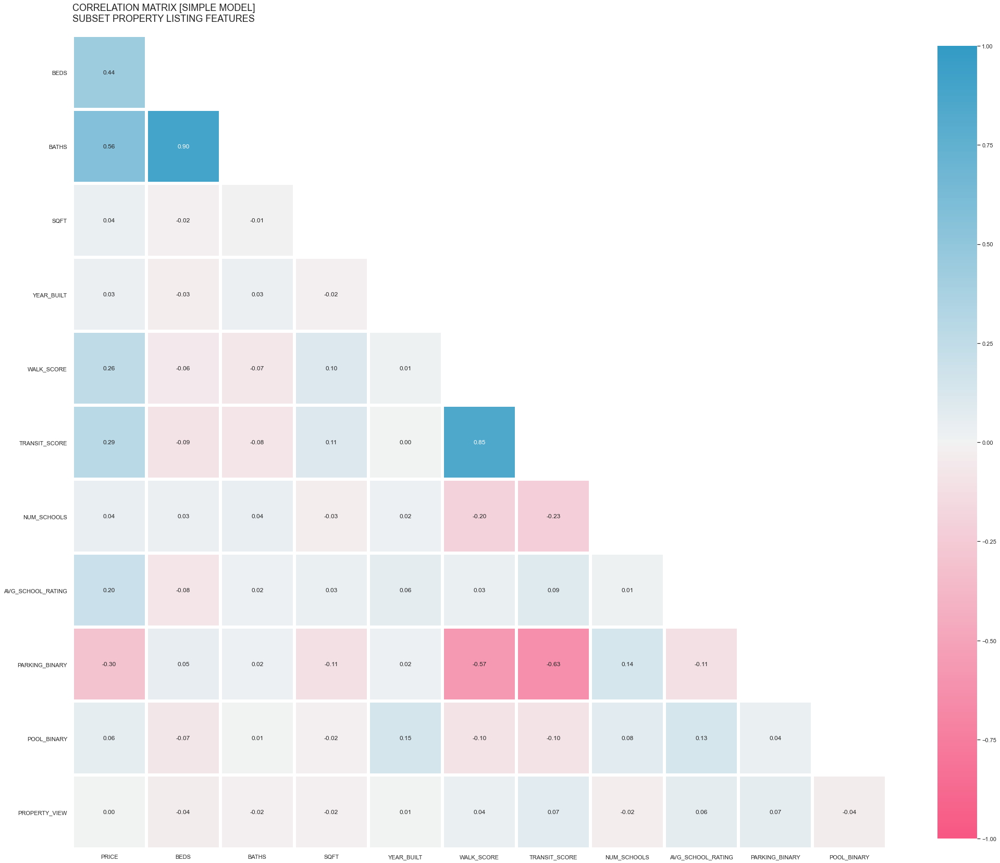

In [277]:
# Correlation matrix

# correlation df
combined_listings_simple_corr = combined_listings_simple.corr()

# mask
mask_combined_simple = np.triu(np.ones_like(combined_listings_simple_corr, dtype=np.bool))

# adjust mask and df
mask_combined_simple = mask_combined_simple[1:,:-1]
corr_combined_simple = combined_listings_simple_corr.iloc[1:,:-1].copy()

# color map
cmap = sns.diverging_palette(0, 230, 90, 60, as_cmap=True)

# plot heatmap
sns.set(rc={"figure.figsize": (35,35)})
sns.set_style("white")
combined_listings_simple_corr_matrix = sns.heatmap(corr_combined_simple, mask=mask_combined_simple, annot=True, fmt=".2f", 
                                linewidths=5, cmap=cmap, vmin=-1, vmax=1, 
                                cbar_kws={"shrink": .8}, square=True)

# ticks
yticks = [i.upper() for i in corr_combined_simple.index]
xticks = [i.upper() for i in corr_combined_simple.columns];

plt.yticks(plt.yticks()[0], labels=yticks, rotation=0)
plt.xticks(plt.xticks()[0], labels=xticks)

# title
title = 'CORRELATION MATRIX [SIMPLE MODEL]\nSUBSET PROPERTY LISTING FEATURES\n'
plt.title(title, loc='left', fontsize=18);

In this correlation matrix, price - the target variable - presents the highest **positive** correlations with: 
- beds and baths - which are quite highly correlated with each other
- walk_score and transit_score - which are quite highly correlated with each other
- average_school_rating
All these positive correlations make sense as we would expect the price to be positively impacted by the above mentioned variables.

Instead, price presents a negative correlation with:
- parking_binary - which is in a way counterintuitive, as we would expect it to be positively correlated with price instead

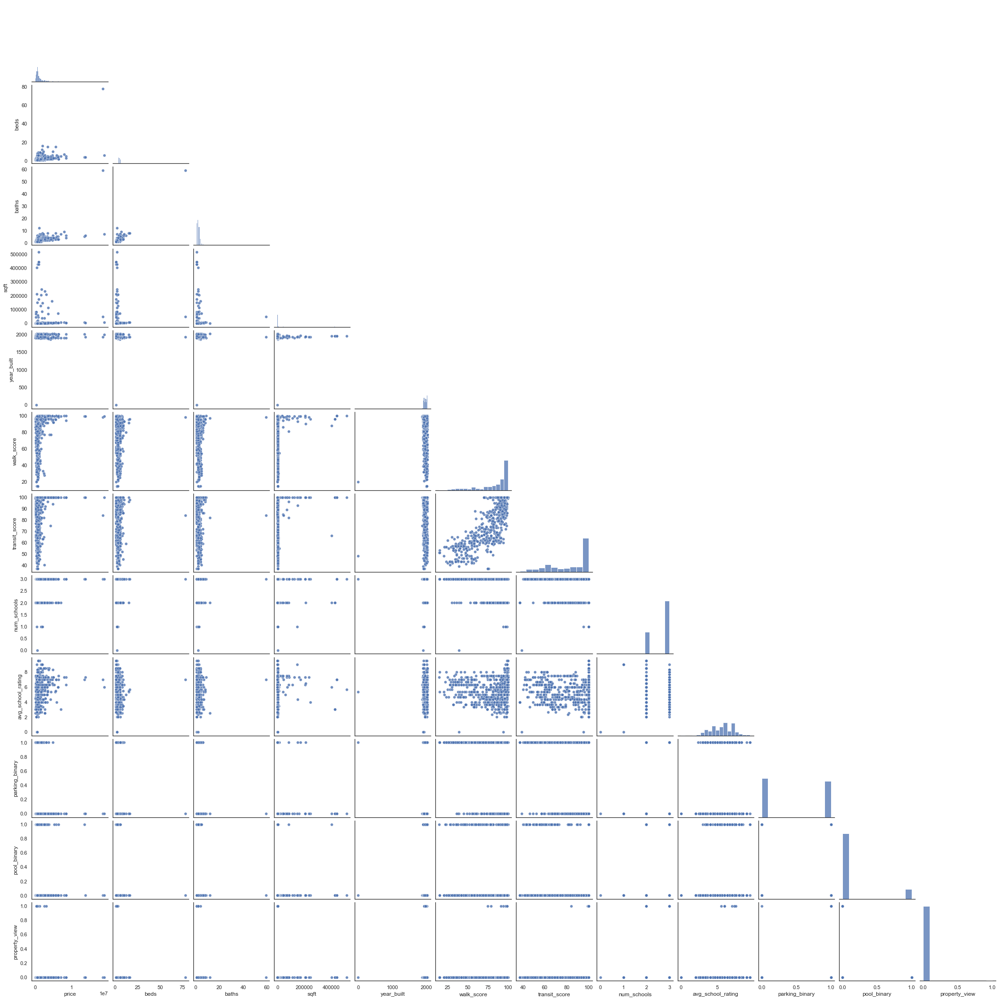

In [279]:
# redraw pairplot
sns.set(rc={"figure.figsize": (40,40)})
sns.set_style("white")
combined_listings_simple_pairplot = sns.pairplot(combined_listings_simple,plot_kws={'alpha':0.8},corner=True);

From the pairplot, we gather that:
- There might be some outliers in the data 
- beds and baths are similarly related to price (target)
- sqft do not seem to be linearly related to price. Feature engineering might be applicable to this predictor.
- walk_score and transit_score are similarly related to price. Feature engineering might be applicable to these predictor.
- parking, pool and view do not seem to be linearly releated to price. <br/>

Let's conduct a simple validation on this version of the model.

In [597]:
def split_and_validate(X, y):
    '''
    For a set of features and target X, y, perform a 80/20 train/val split, 
    fit and validate a linear regression model, and report results
    '''
    
    # perform train/val split
    X_train, X_val, y_train, y_val = \
        train_test_split(X, y, test_size=0.2, random_state=42)
    
    # fit linear regression to training data
    lr_model = LinearRegression()
    lr_model.fit(X_train, y_train)
    
    # score fit model on validation data
    val_score = lr_model.score(X_val, y_val)
    val_adjusted_r2 = 1 - (1-lr_model.score(X_val, y_val))*(len(y_val)-1)/(len(y_val)-X_val.shape[1]-1)
    
    # score fit model on training data
    train_score = lr_model.score(X_train, y_train)
    train_adjusted_r2 = 1 - (1-lr_model.score(X_train, y_train))*(len(y_train)-1)/(len(y_train)-X_train.shape[1]-1)
    
    # report results
    print('\nValidation R^2 score:', val_score)
    print('Validation Adjusted R^2 score:', val_adjusted_r2)
    print('Train R^2 score:', train_score)
    print('Train Adjusted R^2 score:', train_adjusted_r2)
    print('Feature coefficients: \n')
    for feature, coef in zip(X.columns, lr_model.coef_):
        print(feature, ':', f'{coef:.2f}') 

In [598]:
# Separate our features from our target
features_simple = combined_listings_simple.loc[:,['beds', 'baths', 'sqft', 'year_built','walk_score', 
                             'transit_score', 'num_schools', 'avg_school_rating',
                             'parking_binary', 'pool_binary', 'property_view']]

target_simple = combined_listings_simple['price']

In [599]:
split_and_validate(features_simple, target_simple)


Validation R^2 score: 0.32009139774689954
Validation Adjusted R^2 score: 0.26989680294969076
Train R^2 score: 0.5113542977916676
Train Adjusted R^2 score: 0.5028223887054905
Feature coefficients: 

beds : -80879.07
baths : 620825.73
sqft : 0.88
year_built : -528.49
walk_score : 7791.69
transit_score : 12679.50
num_schools : 170050.32
avg_school_rating : 108140.05
parking_binary : -418957.46
pool_binary : 178740.43
property_view : 88671.09


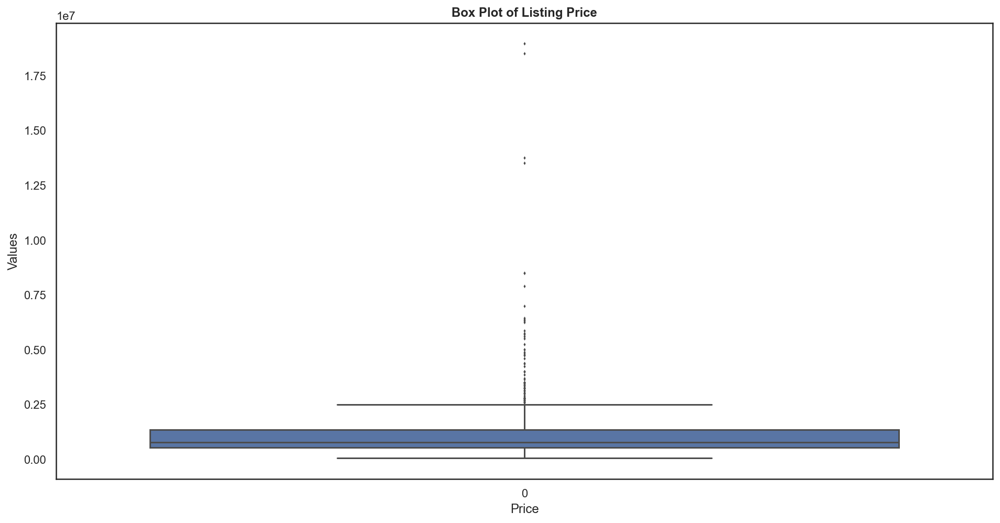

In [286]:
# Investigate outliers in price
sns.set(rc={"figure.figsize": (16, 8)})
sns.set_style("white")
boxplot_price = sns.boxplot(data=combined_listings_simple['price'],fliersize = 1)
boxplot_price.set_ylabel('Values')
boxplot_price.set_xlabel('Price')
boxplot_price.set_title("Box Plot of Listing Price", fontsize = 12,fontweight="bold",loc='center');

In [290]:
# Statistical definition of outlier
listing_price_outliers = (combined_listings_simple['price'] > np.quantile(combined_listings_simple['price'], 0.75))
combined_listings_simple[listing_price_outliers]                                                                                

,listing_id,price,beds,baths,sqft,year_built,walk_score,transit_score,num_schools,avg_school_rating,parking_binary,pool_binary,property_view
192,97517830,8495000.0,5.0,6.0,4100.0,2007,94,100,3,7.333333,0,0,0
0,97495573,1650000.0,2.0,3.0,206411.0,1938,98,100,3,7.333333,0,0,0
205,89071925,1995000.0,3.0,2.0,1434.0,1928,93,100,2,7.000000,1,0,0
206,89070008,1650000.0,2.0,2.0,990.0,2007,98,92,3,4.000000,0,0,0
4,83933235,1595000.0,1.0,2.0,1240.0,1912,99,100,3,7.333333,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
820,122063719,1495000.0,1.0,1.0,860.0,2012,100,100,3,7.333333,0,0,0
822,121712381,2750000.0,4.0,4.0,3121.0,2014,95,100,3,4.000000,0,0,0
190,117451325,2600000.0,3.0,3.0,1634.0,1926,98,100,3,3.000000,0,0,0
835,112077827,1650000.0,2.0,2.0,1129.0,2008,97,89,3,5.333333,1,1,0


In [297]:
combined_listings_simple['price'].describe()

count    8.070000e+02
mean     1.238998e+06
std      1.552038e+06
min      6.000000e+04
25%      5.500000e+05
50%      7.900000e+05
75%      1.350000e+06
max      1.895000e+07
Name: price, dtype: float64

In [301]:
# Alternative and conservative definition (deterministic based on the context) - a listing is an outlier if its price is above USD 10M
listing_price_outliers_2 = (combined_listings_simple['price'] >= 10000000)
combined_listings_simple[listing_price_outliers_2]                                                                                

,listing_id,price,beds,baths,sqft,year_built,walk_score,transit_score,num_schools,avg_school_rating,parking_binary,pool_binary,property_view
648,219647797,13500000.0,4.0,5.0,5891.0,2013,99,100,3,7.000000,0,1,0
675,2103430040,18500000.0,78.0,59.0,46200.0,1926,98,84,3,7.000000,0,0,0
701,2079440089,18950000.0,6.0,7.0,8000.0,2002,99,100,3,6.000000,0,0,0
809,125716855,13750000.0,4.0,6.0,4000.0,1930,99,100,3,7.333333,0,0,0


In [307]:
# Drop outliers
combined_listings_simple = combined_listings_simple[~listing_price_outliers_2] 

In [308]:
combined_listings_simple.shape

(803, 13)

In [600]:
split_and_validate(features_simple,target_simple)


Validation R^2 score: 0.32009139774689954
Validation Adjusted R^2 score: 0.26989680294969076
Train R^2 score: 0.5113542977916676
Train Adjusted R^2 score: 0.5028223887054905
Feature coefficients: 

beds : -80879.07
baths : 620825.73
sqft : 0.88
year_built : -528.49
walk_score : 7791.69
transit_score : 12679.50
num_schools : 170050.32
avg_school_rating : 108140.05
parking_binary : -418957.46
pool_binary : 178740.43
property_view : 88671.09


By taking a conservative approach to eliminating outliers, the model's R^2 does not improve at all.

In [310]:
# Alternative and less conservative definition - a listing is an outlier if its price is above USD 5M
listing_price_outliers_3 = (combined_listings_simple['price'] >= 5000000)
combined_listings_simple[listing_price_outliers_3] 

,listing_id,price,beds,baths,sqft,year_built,walk_score,transit_score,num_schools,avg_school_rating,parking_binary,pool_binary,property_view
192,97517830,8495000.0,5.0,6.0,4100.0,2007,94,100,3,7.333333,0,0,0
11,72539843,5000000.0,3.0,4.0,3100.0,1938,92,100,3,7.333333,0,0,0
256,69524123,5750000.0,4.0,3.0,1980.0,1930,100,100,3,7.000000,0,0,0
431,31536847,7900000.0,7.0,9.0,5178.0,1899,100,100,3,7.333333,0,0,0
73,31526611,6995000.0,5.0,7.0,6000.0,1910,99,100,2,3.000000,0,0,0
74,31523635,6250000.0,5.0,5.0,71880.0,1912,99,100,2,6.000000,0,0,0
510,30572219,5875000.0,6.0,5.0,3840.0,1920,99,100,2,4.000000,0,0,0
515,300195147,6450000.0,2.0,3.0,1977.0,2016,100,100,2,7.500000,0,0,0
689,2090781163,5700000.0,3.0,4.0,1872.0,2019,100,100,3,7.000000,0,1,0
694,2081500800,6380000.0,2.0,3.0,2690.0,2019,98,100,3,7.000000,0,1,0


In [311]:
combined_listings_simple_reduced = combined_listings_simple[~listing_price_outliers_3] 

In [601]:
# Rerun the model
features_simple_reduced = combined_listings_simple_reduced.loc[:,['beds', 'baths', 'sqft', 'year_built','walk_score', 
                             'transit_score', 'num_schools', 'avg_school_rating',
                             'parking_binary', 'pool_binary', 'property_view']]

target_simple_reduced = combined_listings_simple_reduced['price']
split_and_validate(features_simple_reduced,target_simple_reduced)


Validation R^2 score: 0.2653258345951468
Validation Adjusted R^2 score: 0.20997367144820578
Train R^2 score: 0.49305357135812455
Train Adjusted R^2 score: 0.48401562854603286
Feature coefficients: 

beds : 9154.16
baths : 380974.76
sqft : 0.51
year_built : 489.75
walk_score : 4323.11
transit_score : 13451.39
num_schools : 229943.47
avg_school_rating : 130107.35
parking_binary : -372181.13
pool_binary : 170160.13
property_view : 145400.48


By taking a less conservative approach to eliminating outliers, the model's R^2 is lower but all the predictors start becoming positively related to the price, which is in alignment with our hypothesis. The adjusted R^2 is lower than the previous iteration of the model.

In [329]:
# Get summary statistics from stat module
def stats_summary(X,y):
    
    X = sm.add_constant(X)  
    lm_ols = sm.OLS(y, X)  
    lm_ols = lm_ols.fit()
    
    return lm_ols.summary()

In [330]:
# Diplay summary statistics for the simple model with a conservative approach to outliers
stats_summary(features_simple,target_simple)

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.490
Model:                            OLS   Adj. R-squared:                  0.483
Method:                 Least Squares   F-statistic:                     69.13
Date:                Wed, 12 May 2021   Prob (F-statistic):          7.69e-108
Time:                        21:12:14   Log-Likelihood:                -12058.
No. Observations:                 803   AIC:                         2.414e+04
Df Residuals:                     791   BIC:                         2.420e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const             -1.968e+06   7.66e+05     -2.570      0.010   -3.47e+06   -4.65e+05
beds              -2.147e+04   2.12e+04     -1.013      0.311   -6.31e+04    2.01e+04
baths              5.111e+05   3.18e+04     16.058      0.000    4.49e+05    5.74e+05
sqft                  0.2726      0.656      0.415      0.678      -1.016       1.561
year_built         -449.6357    368.137     -1.221      0.222   -1172.277     273.005
walk_score         5593.5428   2655.035      2.107      0.035     381.795    1.08e+04
transit_score      1.529e+04   3081.761      4.961      0.000    9239.212    2.13e+04
num_schools        2.258e+05   6.15e+04      3.672      0.000    1.05e+05    3.46e+05
avg_school_rating  1.322e+05   1.98e+04      6.679      0.000    9.33e+04    1.71e+05
parking_binary    -4.103e+05    7.5e+04     -5.472      0.000   -5.58e+05   -2.63e+05
pool_binary         2.19e+05   8.83e+04      2.479      0.013    4.56e+04    3.92e+05
property_view      1.061e+05   3.14e+05      0.338      0.735   -5.09e+05    7.22e+05
==============================================================================
Omnibus:                      349.789   Durbin-Watson:                   1.577
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3714.334
Skew:                           1.677   Prob(JB):                         0.00
Kurtosis:                      12.988   Cond. No.                     1.20e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.2e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [331]:
# Diplay summary statistics for the simple model with a less conservative approach to outliers
stats_summary(features_simple_reduced,target_simple_reduced)

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.471
Model:                            OLS   Adj. R-squared:                  0.464
Method:                 Least Squares   F-statistic:                     62.81
Date:                Wed, 12 May 2021   Prob (F-statistic):           1.63e-99
Time:                        21:12:19   Log-Likelihood:                -11610.
No. Observations:                 787   AIC:                         2.324e+04
Df Residuals:                     775   BIC:                         2.330e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const             -1.844e+06    5.9e+05     -3.125      0.002      -3e+06   -6.86e+05
beds               1.403e+04   1.67e+04      0.841      0.401   -1.87e+04    4.68e+04
baths               3.49e+05   2.59e+04     13.465      0.000    2.98e+05       4e+05
sqft                  0.4116      0.505      0.816      0.415      -0.579       1.402
year_built         -195.8466    283.737     -0.690      0.490    -752.831     361.138
walk_score         4482.9446   2040.011      2.198      0.028     478.342    8487.547
transit_score      1.252e+04   2370.368      5.283      0.000    7869.478    1.72e+04
num_schools        1.919e+05   4.77e+04      4.027      0.000    9.84e+04    2.85e+05
avg_school_rating  1.216e+05   1.53e+04      7.945      0.000    9.16e+04    1.52e+05
parking_binary    -3.305e+05   5.77e+04     -5.730      0.000   -4.44e+05   -2.17e+05
pool_binary        2.071e+05   6.87e+04      3.015      0.003    7.23e+04    3.42e+05
property_view      1.837e+05   2.41e+05      0.763      0.445   -2.89e+05    6.56e+05
==============================================================================
Omnibus:                      188.305   Durbin-Watson:                   1.510
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              632.817
Skew:                           1.125   Prob(JB):                    3.85e-138
Kurtosis:                       6.773   Cond. No.                     1.20e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.2e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

#### 2. Variant Model | All features excluding areas

In [335]:
# Drop outliers from main df - CONSERVATIVE
combined_listings = combined_listings[~listing_price_outliers_2] 

In [307]:
# Drop outliers
combined_listings_simple = combined_listings_simple[~listing_price_outliers_2] 

In [308]:
combined_listings_simple.shape

(803, 13)

In [602]:
split_and_validate(features_simple,target_simple)


Validation R^2 score: 0.32009139774689954
Validation Adjusted R^2 score: 0.26989680294969076
Train R^2 score: 0.5113542977916676
Train Adjusted R^2 score: 0.5028223887054905
Feature coefficients: 

beds : -80879.07
baths : 620825.73
sqft : 0.88
year_built : -528.49
walk_score : 7791.69
transit_score : 12679.50
num_schools : 170050.32
avg_school_rating : 108140.05
parking_binary : -418957.46
pool_binary : 178740.43
property_view : 88671.09


By taking a conservative approach to eliminating outliers, the model's R^2 does not improve at all.

In [336]:
# Drop outliers from main df - LESS CONSERVATIVE
combined_listings_reduced = combined_listings[~listing_price_outliers_3]

In [337]:
combined_listings.shape

(803, 50)

In [338]:
combined_listings_reduced.shape

(787, 50)

In [339]:
# Define new df for CONSERVATIVE approach to outliers
combined_listings_noarea = combined_listings.loc[:,['listing_id', 'price', 'beds', 'baths', 'sqft', 'year_built',
                                                    'walk_score', 'transit_score', 'num_schools', 'avg_school_rating',
                                                    'parking_binary', 'pool_binary', 'property_view','Condominium',
                                                    'Cooperative','Multi Family','Single Family','Stock Cooperative',
                                                    'Two Family','Other Property Types']]

In [340]:
combined_listings_noarea.shape

(803, 20)

In [344]:
combined_listings_noarea.corr()

,price,beds,baths,sqft,year_built,walk_score,transit_score,num_schools,avg_school_rating,parking_binary,pool_binary,property_view,Condominium,Cooperative,Multi Family,Single Family,Stock Cooperative,Two Family,Other Property Types
price,1.000000,0.232156,0.467781,0.038242,0.027221,0.305545,0.355560,0.016707,0.227119,-0.351765,0.067667,0.009323,0.292168,-0.004025,0.064245,-0.202727,-0.167472,-0.078355,0.076942
beds,0.232156,1.000000,0.677015,-0.077940,-0.032053,-0.145413,-0.157713,0.020227,-0.182602,0.137779,-0.102419,-0.061396,-0.314340,-0.277728,0.637873,0.058411,-0.165179,0.154150,0.046397
baths,0.467781,0.677015,1.000000,-0.061791,0.067527,-0.177163,-0.163051,0.039560,-0.017000,0.098640,0.027552,-0.031921,-0.143976,-0.252928,0.350337,0.105486,-0.193933,0.153609,0.066994
sqft,0.038242,-0.077940,-0.061791,1.000000,-0.016910,0.103456,0.107735,-0.029997,0.032716,-0.109184,-0.018420,-0.015307,-0.095231,0.327465,-0.049180,-0.092721,-0.035624,-0.036207,-0.016992
year_built,0.027221,-0.032053,0.067527,-0.016910,1.000000,0.009257,-0.000348,0.021150,0.062798,0.023650,0.145899,0.006760,0.186026,-0.105355,-0.070580,-0.002286,-0.170981,0.062186,-0.023166
walk_score,0.305545,-0.145413,-0.177163,0.103456,0.009257,1.000000,0.846221,-0.203529,0.029328,-0.567437,-0.097692,0.038731,0.413704,0.266200,0.061596,-0.529989,0.038409,-0.305571,0.015028
transit_score,0.355560,-0.157713,-0.163051,0.107735,-0.000348,0.846221,1.000000,-0.235847,0.086163,-0.624982,-0.100557,0.073526,0.449399,0.304307,0.084655,-0.592057,0.087558,-0.355973,-0.012063
num_schools,0.016707,0.020227,0.039560,-0.029997,0.021150,-0.203529,-0.235847,1.000000,0.010398,0.142777,0.076268,-0.023902,-0.033485,-0.138286,-0.092916,0.213555,-0.194331,0.157559,0.008264
avg_school_rating,0.227119,-0.182602,-0.017000,0.032716,0.062798,0.029328,0.086163,0.010398,1.000000,-0.106366,0.133792,0.065293,0.169581,0.145760,-0.203850,-0.105246,-0.037298,0.021686,-0.037461
parking_binary,-0.351765,0.137779,0.098640,-0.109184,0.023650,-0.567437,-0.624982,0.142777,-0.106366,1.000000,0.040736,0.069698,-0.385507,-0.295013,0.004169,0.453413,0.109849,0.240410,-0.028777


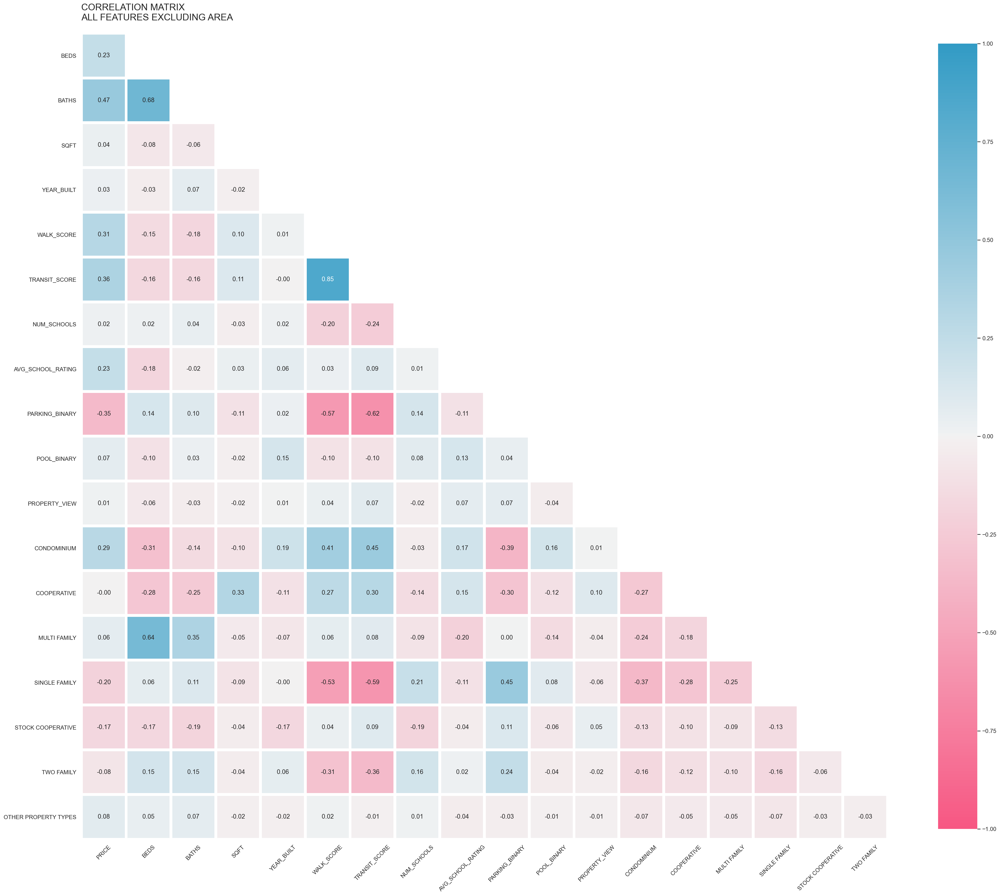

In [347]:
# Correlation matrix

# correlation df
combined_listings_noarea_corr = combined_listings_noarea.corr()

# mask
mask_combined_noarea = np.triu(np.ones_like(combined_listings_noarea_corr, dtype=np.bool))

# adjust mask and df
mask_combined_noarea = mask_combined_noarea[1:,:-1]
corr_combined_noarea = combined_listings_noarea_corr.iloc[1:,:-1].copy()

# color map
cmap = sns.diverging_palette(0, 230, 90, 60, as_cmap=True)

# plot heatmap
sns.set(rc={"figure.figsize": (35,35)})
sns.set_style("white")
combined_listings_noarea_corr_matrix = sns.heatmap(corr_combined_noarea, mask=mask_combined_noarea, annot=True, fmt=".2f", 
                                linewidths=5, cmap=cmap, vmin=-1, vmax=1, 
                                cbar_kws={"shrink": .8}, square=True)

# ticks
yticks = [i.upper() for i in corr_combined_noarea.index]
xticks = [i.upper() for i in corr_combined_noarea.columns];

plt.yticks(plt.yticks()[0], labels=yticks, rotation=0)
plt.xticks(plt.xticks()[0], labels=xticks, rotation=45)

# title
title = 'CORRELATION MATRIX \nALL FEATURES EXCLUDING AREA\n'
plt.title(title, loc='left', fontsize=18);

# save to file
#fig = combined_listings_simple_corr_matrix.get_figure()
#fig.savefig("/Users/valentinarizzati/Desktop/images/combined_listings_simple_corr_matrix.png");

In [348]:
combined_listings_noarea['Condominium'].value_counts()

0    593
1    210
Name: Condominium, dtype: int64

We observe:
- Multi Family property type seems to be positively correlated with number of beds
- Single Family property type seems to be negatively correlated with both walk score and transit score
- Parking is negatively correlated with both walk score and transit score. This makes sense because areas that are densely populated (high walk score and transit score) are likely the ones characterized by scarcity in parking. 
- Price is positively related with condominiums. From a qualitative perspective, this makes sense because condos are characterized by the most significant demand in NYC. Also, condomiuniums represent the majority of our sample.

In [351]:
# Define feature and target for CONSERVATIVE approach to outliers
features_noarea = combined_listings_noarea.loc[:,['beds', 'baths', 'sqft', 'year_built',
                                                'walk_score', 'transit_score', 'num_schools', 'avg_school_rating',
                                                'parking_binary', 'pool_binary', 'property_view','Condominium',
                                                'Cooperative','Multi Family','Single Family','Stock Cooperative',
                                                'Two Family','Other Property Types']]

target_noarea = combined_listings_noarea['price']

In [603]:
# Evaluate model for CONSERVATIVE approach to outliers
split_and_validate(features_noarea,target_noarea)


Validation R^2 score: 0.35705841369839086
Validation Adjusted R^2 score: 0.2755587759981869
Train R^2 score: 0.5406032646572909
Train Adjusted R^2 score: 0.5273301647597488
Feature coefficients: 

beds : 2528.28
baths : 596772.63
sqft : 1.25
year_built : -839.10
walk_score : 5878.48
transit_score : 11898.54
num_schools : 134405.35
avg_school_rating : 91884.35
parking_binary : -306466.33
pool_binary : 103704.11
property_view : -25273.94
Condominium : 473471.68
Cooperative : 181754.54
Multi Family : -381801.73
Single Family : 45487.13
Stock Cooperative : -87293.36
Two Family : -144175.31
Other Property Types : 519011.87


Score have improved marginally. Now the coefficient on beds has taken the expected positive direction. But some other coefficients like

In [353]:
# Define new df for LESS CONSERVATIVE approach to outliers
combined_listings_noarea_reduced = combined_listings_reduced.loc[:,['listing_id', 'price', 'beds', 'baths', 'sqft', 'year_built',
                                                    'walk_score', 'transit_score', 'num_schools', 'avg_school_rating',
                                                    'parking_binary', 'pool_binary', 'property_view','Condominium',
                                                    'Cooperative','Multi Family','Single Family','Stock Cooperative',
                                                    'Two Family','Other Property Types']]

In [356]:
# Define feature and target for LESS CONSERVATIVE approach to outliers
features_noarea_reduced = combined_listings_noarea_reduced.loc[:,['beds', 'baths', 'sqft', 'year_built',
                                                'walk_score', 'transit_score', 'num_schools', 'avg_school_rating',
                                                'parking_binary', 'pool_binary', 'property_view','Condominium',
                                                'Cooperative','Multi Family','Single Family','Stock Cooperative',
                                                'Two Family','Other Property Types']]

target_noarea_reduced = combined_listings_noarea_reduced['price']

In [604]:
# Evaluate model for LESS CONSERVATIVE approach to outliers
split_and_validate(features_noarea_reduced,target_noarea_reduced)


Validation R^2 score: 0.21125824479134692
Validation Adjusted R^2 score: 0.10911902469238466
Train R^2 score: 0.5479603557392027
Train Adjusted R^2 score: 0.5346214809905234
Feature coefficients: 

beds : 49031.08
baths : 360395.93
sqft : 1.52
year_built : -1941.57
walk_score : 2179.89
transit_score : 12639.81
num_schools : 167440.47
avg_school_rating : 122860.44
parking_binary : -277659.15
pool_binary : 103036.14
property_view : 204948.68
Condominium : 446531.80
Cooperative : -197067.19
Multi Family : -239946.72
Single Family : -32240.67
Stock Cooperative : -280126.84
Two Family : -99779.69
Other Property Types : 72144.52


In this case the R^2 decrease significantly.

#### 3. Variant Model | All features

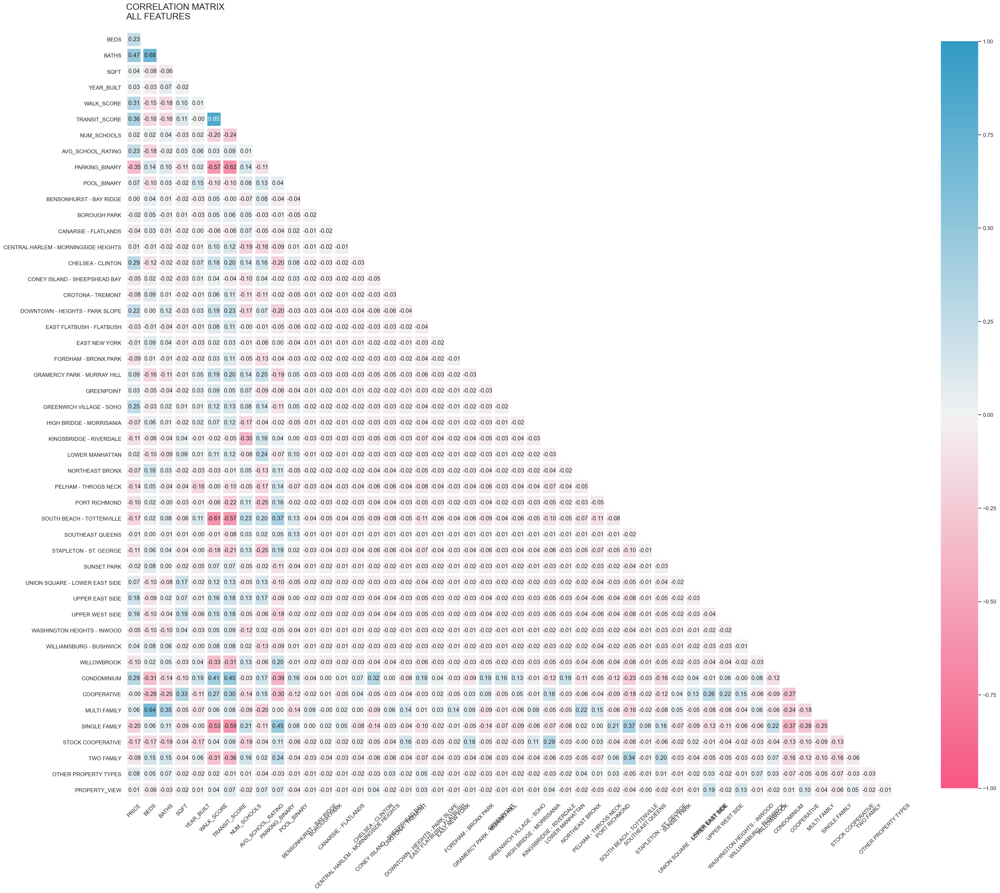

In [360]:
# Correlation matrix

# correlation df
combined_listings_corr = combined_listings.corr()

# mask
mask = np.triu(np.ones_like(combined_listings_corr, dtype=np.bool))

# adjust mask and df
mask = mask[1:,:-1]
corr = combined_listings_corr.iloc[1:,:-1].copy()

# color map
cmap = sns.diverging_palette(0, 230, 90, 60, as_cmap=True)

# plot heatmap
sns.set(rc={"figure.figsize": (35,35)})
sns.set_style("white")
combined_listings_corr_matrix = sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", 
                                linewidths=5, cmap=cmap, vmin=-1, vmax=1, 
                                cbar_kws={"shrink": .8}, square=True)

# ticks
yticks = [i.upper() for i in corr.index]
xticks = [i.upper() for i in corr.columns];

plt.yticks(plt.yticks()[0], labels=yticks, rotation=0)
plt.xticks(plt.xticks()[0], labels=xticks, rotation=45)

# title
title = 'CORRELATION MATRIX \nALL FEATURES\n'
plt.title(title, loc='left', fontsize=18);

# save to file
#fig = combined_listings_simple_corr_matrix.get_figure()
#fig.savefig("/Users/valentinarizzati/Desktop/images/combined_listings_simple_corr_matrix.png");

In [362]:
combined_listings.columns.tolist()

['listing_id',
 'price',
 'beds',
 'baths',
 'sqft',
 'year_built',
 'walk_score',
 'transit_score',
 'num_schools',
 'avg_school_rating',
 'parking_binary',
 'pool_binary',
 'Bensonhurst - Bay Ridge',
 'Borough Park',
 'Canarsie - Flatlands',
 'Central Harlem - Morningside Heights',
 'Chelsea - Clinton',
 'Coney Island - Sheepshead Bay',
 'Crotona - Tremont',
 'Downtown - Heights - Park Slope',
 'East Flatbush - Flatbush',
 'East New York',
 'Fordham - Bronx Park',
 'Gramercy Park - Murray Hill',
 'Greenpoint',
 'Greenwich Village - SoHo',
 'High Bridge - Morrisania',
 'Kingsbridge - Riverdale',
 'Lower Manhattan',
 'Northeast Bronx',
 'Pelham - Throgs Neck',
 'Port Richmond',
 'South Beach - Tottenville',
 'Southeast Queens',
 'Stapleton - St. George',
 'Sunset Park',
 'Union Square - Lower East Side',
 'Upper East Side',
 'Upper West Side',
 'Washington Heights - Inwood',
 'Williamsburg - Bushwick',
 'Willowbrook',
 'Condominium',
 'Cooperative',
 'Multi Family',
 'Single Family',
 

In [363]:
# Define feature and target for CONSERVATIVE approach to outliers
features_full = combined_listings.loc[:,['beds', 'baths', 'sqft', 'year_built',
                                        'walk_score', 'transit_score', 'num_schools', 'avg_school_rating',
                                        'parking_binary', 'pool_binary', 'property_view','Condominium',
                                        'Cooperative','Multi Family','Single Family','Stock Cooperative',
                                        'Two Family','Other Property Types','Bensonhurst - Bay Ridge',
                                         'Borough Park', 'Canarsie - Flatlands', 'Central Harlem - Morningside Heights',
                                         'Chelsea - Clinton','Coney Island - Sheepshead Bay','Crotona - Tremont',
                                         'Downtown - Heights - Park Slope','East Flatbush - Flatbush','East New York',
                                         'Fordham - Bronx Park','Gramercy Park - Murray Hill','Greenpoint',
                                         'Greenwich Village - SoHo','High Bridge - Morrisania','Kingsbridge - Riverdale',
                                         'Lower Manhattan', 'Northeast Bronx','Pelham - Throgs Neck','Port Richmond',
                                         'South Beach - Tottenville','Southeast Queens','Stapleton - St. George','Sunset Park',
                                         'Union Square - Lower East Side','Upper East Side','Upper West Side','Washington Heights - Inwood',
                                         'Williamsburg - Bushwick','Willowbrook']]

target_full = combined_listings['price']

In [605]:
# Evaluate model for CONSERVATIVE approach to outliers
split_and_validate(features_full,target_full)


Validation R^2 score: 0.4371161196805402
Validation Adjusted R^2 score: 0.19588017097220034
Train R^2 score: 0.6682021763819177
Train Adjusted R^2 score: 0.6413450169659516
Feature coefficients: 

beds : 54225.73
baths : 476004.66
sqft : -0.79
year_built : -500.01
walk_score : 1819.00
transit_score : 4668.43
num_schools : -202458.84
avg_school_rating : -14981.10
parking_binary : -182381.37
pool_binary : 90526.90
property_view : -72476.80
Condominium : 141204.59
Cooperative : 83518.13
Multi Family : -153792.09
Single Family : 165347.97
Stock Cooperative : 240317.98
Two Family : -19077.92
Other Property Types : 554942.51
Bensonhurst - Bay Ridge : 30057.25
Borough Park : -80553.27
Canarsie - Flatlands : -408990.34
Central Harlem - Morningside Heights : -22844.51
Chelsea - Clinton : 1790315.17
Coney Island - Sheepshead Bay : -156575.56
Crotona - Tremont : -780449.04
Downtown - Heights - Park Slope : 599166.35
East Flatbush - Flatbush : -47099.32
East New York : -334987.24
Fordham - Bronx 

In [366]:
# Define feature and target for LESS CONSERVATIVE approach to outliers
features_full_reduced = combined_listings_reduced.loc[:,['beds', 'baths', 'sqft', 'year_built',
                                        'walk_score', 'transit_score', 'num_schools', 'avg_school_rating',
                                        'parking_binary', 'pool_binary', 'property_view','Condominium',
                                        'Cooperative','Multi Family','Single Family','Stock Cooperative',
                                        'Two Family','Other Property Types','Bensonhurst - Bay Ridge',
                                         'Borough Park', 'Canarsie - Flatlands', 'Central Harlem - Morningside Heights',
                                         'Chelsea - Clinton','Coney Island - Sheepshead Bay','Crotona - Tremont',
                                         'Downtown - Heights - Park Slope','East Flatbush - Flatbush','East New York',
                                         'Fordham - Bronx Park','Gramercy Park - Murray Hill','Greenpoint',
                                         'Greenwich Village - SoHo','High Bridge - Morrisania','Kingsbridge - Riverdale',
                                         'Lower Manhattan', 'Northeast Bronx','Pelham - Throgs Neck','Port Richmond',
                                         'South Beach - Tottenville','Southeast Queens','Stapleton - St. George','Sunset Park',
                                         'Union Square - Lower East Side','Upper East Side','Upper West Side','Washington Heights - Inwood',
                                         'Williamsburg - Bushwick','Willowbrook']]


target_full_reduced = combined_listings_reduced['price']

In [606]:
# Evaluate model for LESS CONSERVATIVE approach to outliers
split_and_validate(features_full_reduced,target_full_reduced)


Validation R^2 score: 0.4118099961560846
Validation Adjusted R^2 score: 0.15279054492206678
Train R^2 score: 0.6798623744228356
Train Adjusted R^2 score: 0.6533682260992082
Feature coefficients: 

beds : 101089.77
baths : 256348.22
sqft : 0.61
year_built : -1271.08
walk_score : -1213.26
transit_score : 4752.54
num_schools : -123844.75
avg_school_rating : 54803.49
parking_binary : -154764.94
pool_binary : 113443.50
property_view : -201506.67
Condominium : 198920.53
Cooperative : -283782.20
Multi Family : -80150.46
Single Family : 94809.32
Stock Cooperative : -83510.12
Two Family : 54086.60
Other Property Types : 94815.09
Bensonhurst - Bay Ridge : 10405.03
Borough Park : 18485.38
Canarsie - Flatlands : -336774.74
Central Harlem - Morningside Heights : 211777.77
Chelsea - Clinton : 1105413.89
Coney Island - Sheepshead Bay : -209983.24
Crotona - Tremont : -565180.06
Downtown - Heights - Park Slope : 691428.16
East Flatbush - Flatbush : 304.05
East New York : -227078.29
Fordham - Bronx Par

In this case the R^2 decrease significantly.

In both cases, regardless of the treatment of outliers, the R^2 has increased but the Adjusted R^2 has decreased. The coefficients are somewhat counterintuitive (e.g. walk_score has a negative impact on price).

#### 4. Variant Model | All features | combine walk and transit score

Walk score and transit score are highly correlated. Hence, I will test a couple of transformations to the features.

In [378]:
# Addition 
combined_listings['walk_transit_score'] = combined_listings['walk_score'] + combined_listings['transit_score']

In [379]:
combined_listings.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 803 entries, 192 to 837
Data columns (total 51 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   listing_id                            803 non-null    object 
 1   price                                 803 non-null    float64
 2   beds                                  803 non-null    float64
 3   baths                                 803 non-null    float64
 4   sqft                                  803 non-null    float64
 5   year_built                            803 non-null    int64  
 6   walk_score                            803 non-null    int64  
 7   transit_score                         803 non-null    int64  
 8   num_schools                           803 non-null    int64  
 9   avg_school_rating                     803 non-null    float64
 10  parking_binary                        803 non-null    int64  
 11  pool_binary      

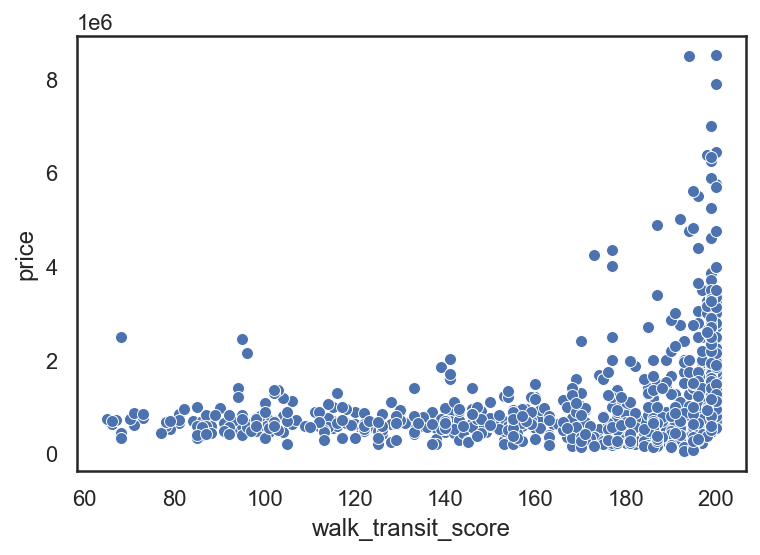

In [405]:
# Visualize new variable
plot_walk_transit_score = sns.scatterplot(data=combined_listings, x='walk_transit_score', y='price')
plot_walk_transit_score;

In [391]:
# Log transformation
combined_listings['walk_transit_score_log'] = np.log10(combined_listings['walk_transit_score'])

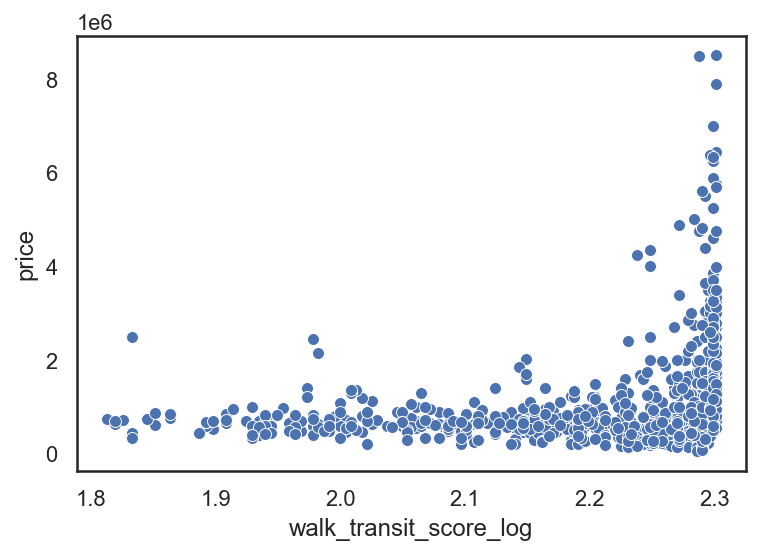

In [406]:
# Visualize new variable
plot_walk_transit_log = sns.scatterplot(data=combined_listings, x='walk_transit_score_log', y='price')
plot_walk_transit_log;

The log transformation does not improve the relationship between the target and the feature.

In [399]:
# Investigate distribution of walk_transit_score 
q3_score = np.quantile(combined_listings['walk_transit_score'],0.75)
print(q3_score)

198.0


25% of the total observations is distributed in the top 1% of the categorical scale 0 - 200. From the pairplot above, we observe that both distributions of walk_score and transit_score are heavily skewed to the right.

In [400]:
# Recategorization to a categorical binary variable
score_conditions = [combined_listings['walk_transit_score'] >= q3_score]

# Create outputs for feature engineering on property type
score_outputs = [1]

# Create new column 'Other Property Types'
combined_listings['walk_transit_binary'] = np.select(score_conditions, score_outputs, 0)

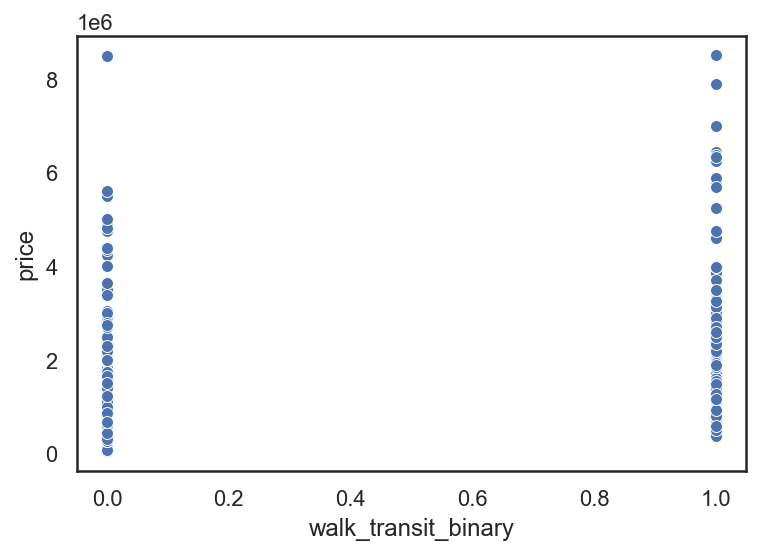

In [407]:
# Visualize new variable
plot_walk_transit_binary = sns.scatterplot(data=combined_listings, x='walk_transit_binary', y='price')
plot_walk_transit_binary;

In [620]:
# Define feature and target for LESS CONSERVATIVE approach to outliers
features_ = combined_listings.loc[:,['beds', 'baths', 'sqft', 'year_built',
                                    'walk_transit_binary', 'num_schools', 'avg_school_rating',
                                    'parking_binary', 'pool_binary', 'Condominium',
                                    'Cooperative','Multi Family','Single Family','Stock Cooperative',
                                    'Two Family','Other Property Types','Bensonhurst - Bay Ridge',
                                    'Borough Park', 'Canarsie - Flatlands', 'Central Harlem - Morningside Heights',
                                    'Chelsea - Clinton','Coney Island - Sheepshead Bay','Crotona - Tremont',
                                    'Downtown - Heights - Park Slope','East Flatbush - Flatbush','East New York',
                                    'Fordham - Bronx Park','Gramercy Park - Murray Hill','Greenpoint',
                                    'Greenwich Village - SoHo','High Bridge - Morrisania','Kingsbridge - Riverdale',
                                    'Lower Manhattan', 'Northeast Bronx','Pelham - Throgs Neck','Port Richmond',
                                    'South Beach - Tottenville','Southeast Queens','Stapleton - St. George','Sunset Park',
                                    'Union Square - Lower East Side','Upper East Side','Upper West Side','Washington Heights - Inwood',
                                    'Williamsburg - Bushwick','Willowbrook']]


target_ = combined_listings['price']

In [621]:
split_and_validate(features_,target_)


Validation R^2 score: 0.539932255872212
Validation Adjusted R^2 score: 0.30737053906036327
Train R^2 score: 0.7255837321435484
Train Adjusted R^2 score: 0.7004880098346085
Feature coefficients: 

beds : 66610.68
baths : 128487.94
sqft : 0.45
year_built : -311.59
walk_transit_binary : 9776.27
num_schools : -35291.82
avg_school_rating : 39705.88
parking_binary : -52391.72
pool_binary : 94428.16
Condominium : 100287.27
Cooperative : -151671.93
Multi Family : 94424.66
Single Family : 135999.71
Stock Cooperative : -131600.46
Two Family : 204054.55
Other Property Types : 174924.03
Bensonhurst - Bay Ridge : -163213.48
Borough Park : -12760.05
Canarsie - Flatlands : -399044.99
Central Harlem - Morningside Heights : 82906.58
Chelsea - Clinton : 418221.89
Coney Island - Sheepshead Bay : -265012.55
Crotona - Tremont : -552811.08
Downtown - Heights - Park Slope : 301977.02
East Flatbush - Flatbush : -214779.28
East New York : -101106.39
Fordham - Bronx Park : -507890.97
Gramercy Park - Murray Hil

The R^2 is pretty stable with respect to model # 3. 

#### 5. Variant Model | All features | combine bed and baths

Beds and baths are highly positively correlated. I will combine them through feature engineering.

In [408]:
# Addition
combined_listings['rooms'] = combined_listings['beds'] + combined_listings['baths']

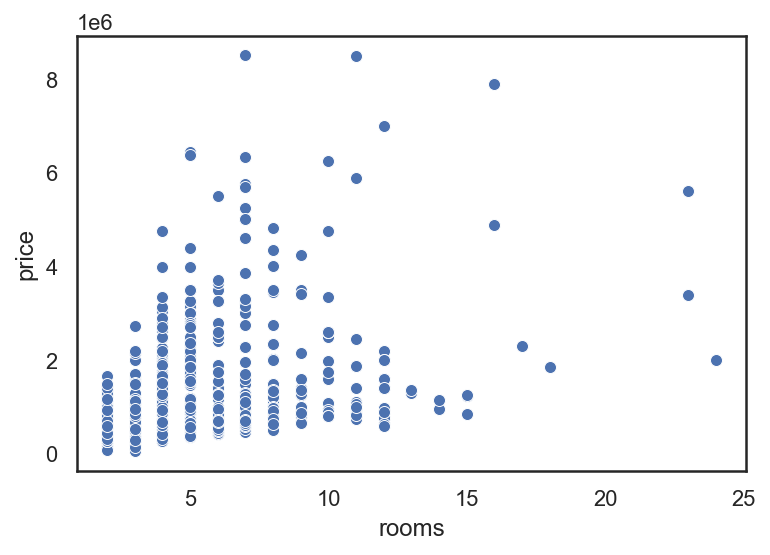

In [409]:
# Visualize new variable
plot_rooms = sns.scatterplot(data=combined_listings, x='rooms', y='price')
plot_rooms;

In [622]:
# Define feature and target for LESS CONSERVATIVE approach to outliers
features_ = combined_listings.loc[:,['rooms', 'sqft', 'year_built',
                                        'walk_transit_binary', 'num_schools', 'avg_school_rating',
                                        'parking_binary', 'pool_binary','Condominium',
                                        'Cooperative','Multi Family','Single Family','Stock Cooperative',
                                        'Two Family','Other Property Types','Bensonhurst - Bay Ridge',
                                         'Borough Park', 'Canarsie - Flatlands', 'Central Harlem - Morningside Heights',
                                         'Chelsea - Clinton','Coney Island - Sheepshead Bay','Crotona - Tremont',
                                         'Downtown - Heights - Park Slope','East Flatbush - Flatbush','East New York',
                                         'Fordham - Bronx Park','Gramercy Park - Murray Hill','Greenpoint',
                                         'Greenwich Village - SoHo','High Bridge - Morrisania','Kingsbridge - Riverdale',
                                         'Lower Manhattan', 'Northeast Bronx','Pelham - Throgs Neck','Port Richmond',
                                         'South Beach - Tottenville','Southeast Queens','Stapleton - St. George','Sunset Park',
                                         'Union Square - Lower East Side','Upper East Side','Upper West Side','Washington Heights - Inwood',
                                         'Williamsburg - Bushwick','Willowbrook']]


target_ = combined_listings['price']

In [623]:
split_and_validate(features_,target_)


Validation R^2 score: 0.5724189857548083
Validation Adjusted R^2 score: 0.36327609835226893
Train R^2 score: 0.7212028288359615
Train Adjusted R^2 score: 0.6963102242677438
Feature coefficients: 

rooms : 91246.81
sqft : 0.45
year_built : -115.71
walk_transit_binary : 6535.01
num_schools : -35319.64
avg_school_rating : 43533.81
parking_binary : -52489.64
pool_binary : 99736.10
Condominium : 99175.54
Cooperative : -149448.45
Multi Family : 69580.70
Single Family : 142850.27
Stock Cooperative : -130719.32
Two Family : 200799.37
Other Property Types : 184665.15
Bensonhurst - Bay Ridge : -168473.13
Borough Park : -19280.82
Canarsie - Flatlands : -401701.68
Central Harlem - Morningside Heights : 83608.27
Chelsea - Clinton : 421932.68
Coney Island - Sheepshead Bay : -265691.39
Crotona - Tremont : -563327.62
Downtown - Heights - Park Slope : 306344.13
East Flatbush - Flatbush : -212820.15
East New York : -95296.17
Fordham - Bronx Park : -491188.37
Gramercy Park - Murray Hill : 200041.13
Gree

The R^2 has significantly improved but some coefficients have a direction that is quite counterintuitive like number of schools have a direction that is counterintuitive with respect to our hypotheses.

In [414]:
combined_listings['property_view'].value_counts()

0    796
1      7
Name: property_view, dtype: int64

In [432]:
# Alternative and less conservative definition - a listing is an outlier if its price is above USD 5M
listing_price_outliers_less_cons = (combined_listings['price'] >= 5000000)
combined_listings[listing_price_outliers_less_cons] 

,listing_id,price,beds,baths,sqft,year_built,walk_score,transit_score,num_schools,avg_school_rating,...,Multi Family,Single Family,Stock Cooperative,Two Family,Other Property Types,property_view,walk_transit_score,walk_transit_score_log,walk_transit_binary,rooms
192,97517830,8495000.0,5.0,6.0,4100.0,2007,94,100,3,7.333333,...,0,0,0,0,0,0,194,2.287802,0,11.0
11,72539843,5000000.0,3.0,4.0,3100.0,1938,92,100,3,7.333333,...,0,0,0,0,0,0,192,2.283301,0,7.0
256,69524123,5750000.0,4.0,3.0,1980.0,1930,100,100,3,7.000000,...,0,0,0,0,0,0,200,2.301030,1,7.0
431,31536847,7900000.0,7.0,9.0,5178.0,1899,100,100,3,7.333333,...,0,0,0,0,1,0,200,2.301030,1,16.0
73,31526611,6995000.0,5.0,7.0,6000.0,1910,99,100,2,3.000000,...,0,1,0,0,0,0,199,2.298853,1,12.0
74,31523635,6250000.0,5.0,5.0,71880.0,1912,99,100,2,6.000000,...,0,0,0,0,0,0,199,2.298853,1,10.0
510,30572219,5875000.0,6.0,5.0,3840.0,1920,99,100,2,4.000000,...,0,1,0,0,0,0,199,2.298853,1,11.0
515,300195147,6450000.0,2.0,3.0,1977.0,2016,100,100,2,7.500000,...,0,0,0,0,0,0,200,2.301030,1,5.0
689,2090781163,5700000.0,3.0,4.0,1872.0,2019,100,100,3,7.000000,...,0,0,0,0,0,0,200,2.301030,1,7.0
694,2081500800,6380000.0,2.0,3.0,2690.0,2019,98,100,3,7.000000,...,0,0,0,0,0,0,198,2.296665,1,5.0


In [433]:
# Drop outliers with the less conservative approach
combined_listings = combined_listings[~listing_price_outliers_less_cons] 

In [436]:
combined_listings.shape

(787, 54)

In [624]:
# Repeat the test
split_and_validate(features_,target_)


Validation R^2 score: 0.5724189857548083
Validation Adjusted R^2 score: 0.36327609835226893
Train R^2 score: 0.7212028288359615
Train Adjusted R^2 score: 0.6963102242677438
Feature coefficients: 

rooms : 91246.81
sqft : 0.45
year_built : -115.71
walk_transit_binary : 6535.01
num_schools : -35319.64
avg_school_rating : 43533.81
parking_binary : -52489.64
pool_binary : 99736.10
Condominium : 99175.54
Cooperative : -149448.45
Multi Family : 69580.70
Single Family : 142850.27
Stock Cooperative : -130719.32
Two Family : 200799.37
Other Property Types : 184665.15
Bensonhurst - Bay Ridge : -168473.13
Borough Park : -19280.82
Canarsie - Flatlands : -401701.68
Central Harlem - Morningside Heights : 83608.27
Chelsea - Clinton : 421932.68
Coney Island - Sheepshead Bay : -265691.39
Crotona - Tremont : -563327.62
Downtown - Heights - Park Slope : 306344.13
East Flatbush - Flatbush : -212820.15
East New York : -95296.17
Fordham - Bronx Park : -491188.37
Gramercy Park - Murray Hill : 200041.13
Gree

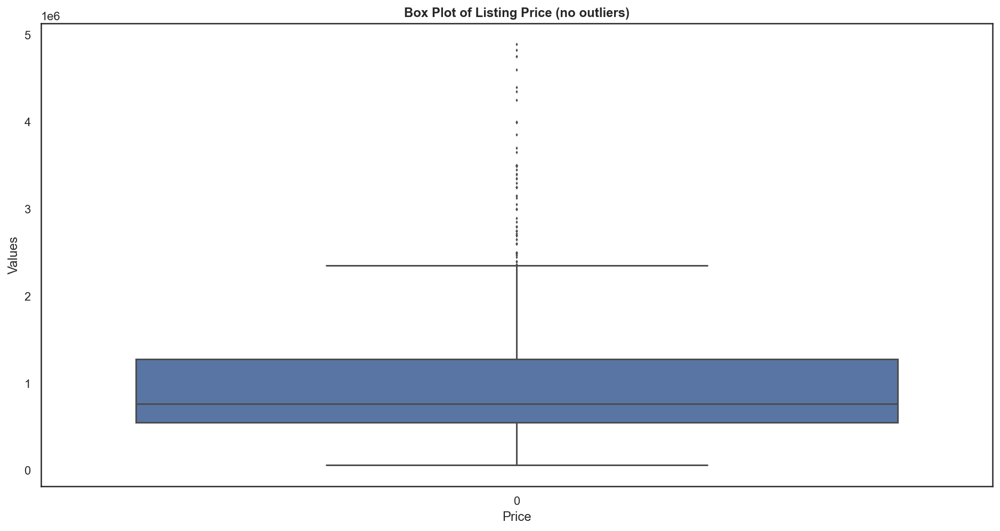

In [437]:
# Investigate outliers in price
sns.set(rc={"figure.figsize": (16, 8)})
sns.set_style("white")
boxplot_price_no = sns.boxplot(data=combined_listings['price'],fliersize = 1)
boxplot_price_no.set_ylabel('Values')
boxplot_price_no.set_xlabel('Price')
boxplot_price_no.set_title("Box Plot of Listing Price (no outliers)", fontsize = 12,fontweight="bold",loc='center');

The situation has certainly improved. There still seems to be some unexpectedly extreme observations on the high end. Later on, I will consider if I need to remove more outliers.

In [438]:
combined_listings['property_view'].value_counts()

0    780
1      7
Name: property_view, dtype: int64

Following the same approach I used before for the view features, I will eliminate this variable because it has very limited informative value in predicting the target or interpreting the model. There are only 7 1s corresponding to this column in the current df - this represents only 0.89% of the total amount of observations.

In [439]:
combined_listings.drop('property_view',axis=1,inplace = True)

In [440]:
combined_listings.shape

(787, 53)

#### 6. Variant Model | All features | adjust year_built and recategorize sqft

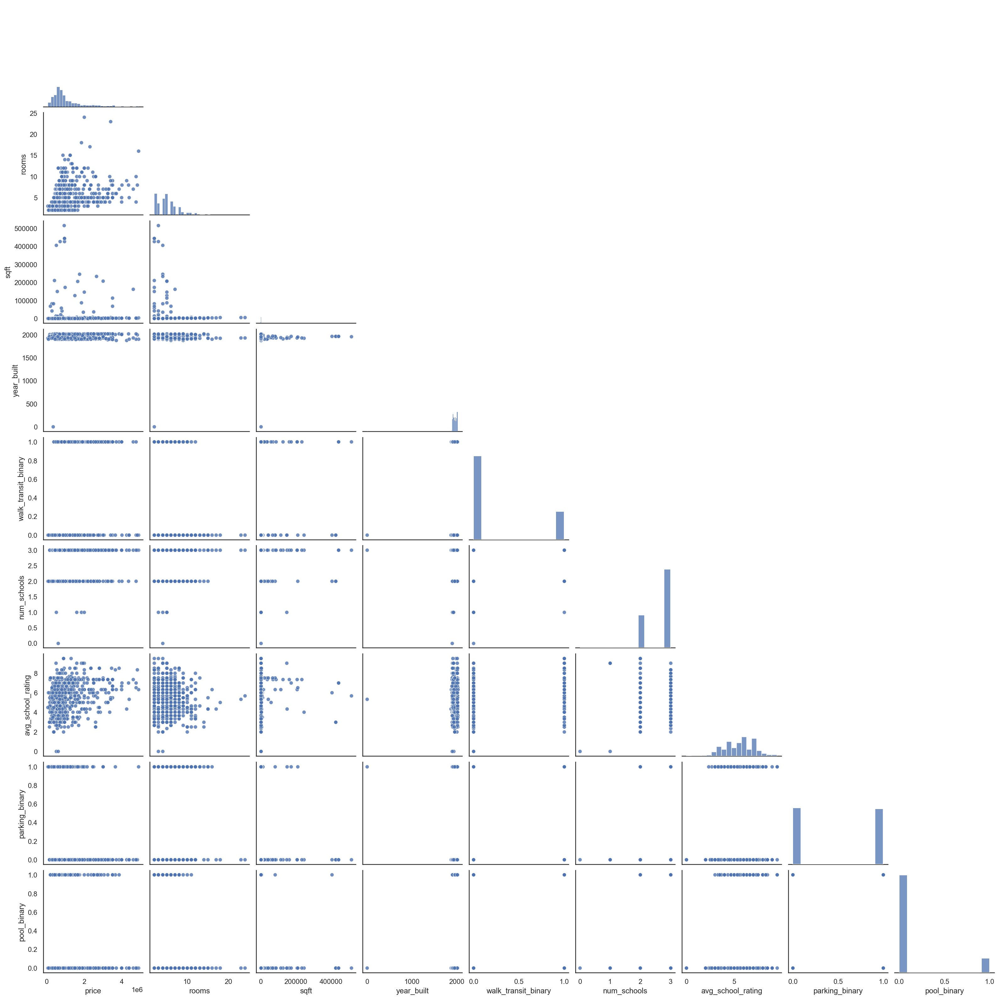

In [442]:
# Repeat pairplot for baseline model (no area, no property type)
sns.set(rc={"figure.figsize": (40,40)})
sns.set_style("white")
combined_listings_pairplot = sns.pairplot(combined_listings, vars=['price', 'rooms', 'sqft', 'year_built',
                                                                   'walk_transit_binary', 'num_schools', 'avg_school_rating',
                                                                   'parking_binary', 'pool_binary'],plot_kws={'alpha':0.8},corner=True);

In [444]:
# Investigate outlier in year_built
combined_listings[combined_listings['year_built']<1500]

,listing_id,price,beds,baths,sqft,year_built,walk_score,transit_score,num_schools,avg_school_rating,...,Cooperative,Multi Family,Single Family,Stock Cooperative,Two Family,Other Property Types,walk_transit_score,walk_transit_score_log,walk_transit_binary,rooms
731,2071348268,341000.0,1.0,1.0,660.0,0,20,48,3,5.333333,...,0,0,0,1,0,0,68,1.832509,0,2.0


We need to remove this observation.

In [445]:
# Remove the observation for which year_built = 0
combined_listings.drop(combined_listings.loc[combined_listings['year_built']==0].index, inplace=True)

In [446]:
combined_listings.shape

(786, 53)

In [449]:
# Investigate outlier in year_built
combined_listings['sqft'].describe()

count       786.000000
mean       8258.474555
std       44440.177811
min           2.000000
25%         942.750000
50%        1400.000000
75%        2100.000000
max      515425.000000
Name: sqft, dtype: float64

Sqft has a very sparse distribution. We need to recategorize this variable.

In [452]:
# Create conditions for feature engineering on sqft
sqft_conditions = [
    combined_listings['sqft'] <= np.quantile(combined_listings['sqft'],0.33),
    (combined_listings['sqft'] <= np.quantile(combined_listings['sqft'],0.66)) & (combined_listings['sqft'] > np.quantile(combined_listings['sqft'],0.33)),
    combined_listings['sqft'] > np.quantile(combined_listings['sqft'],0.66),
]

# Create outputs for feature engineering on property type
sqft_outputs = ['small_size','medium_size','large_size']

# Create new column 'Other Property Types'
combined_listings['sqft_categories'] = np.select(sqft_conditions, sqft_outputs)

In [453]:
combined_listings['sqft_categories'].value_counts()

large_size     267
small_size     264
medium_size    255
Name: sqft_categories, dtype: int64

In [454]:
# Create dummies from sqft_categories
combined_listings = pd.concat([combined_listings, pd.get_dummies(combined_listings['sqft_categories'], drop_first = True)], axis=1)

In [456]:
combined_listings.shape

(786, 56)

In [457]:
combined_listings.columns

Index(['listing_id', 'price', 'beds', 'baths', 'sqft', 'year_built',
       'walk_score', 'transit_score', 'num_schools', 'avg_school_rating',
       'parking_binary', 'pool_binary', 'Bensonhurst - Bay Ridge',
       'Borough Park', 'Canarsie - Flatlands',
       'Central Harlem - Morningside Heights', 'Chelsea - Clinton',
       'Coney Island - Sheepshead Bay', 'Crotona - Tremont',
       'Downtown - Heights - Park Slope', 'East Flatbush - Flatbush',
       'East New York', 'Fordham - Bronx Park', 'Gramercy Park - Murray Hill',
       'Greenpoint', 'Greenwich Village - SoHo', 'High Bridge - Morrisania',
       'Kingsbridge - Riverdale', 'Lower Manhattan', 'Northeast Bronx',
       'Pelham - Throgs Neck', 'Port Richmond', 'South Beach - Tottenville',
       'Southeast Queens', 'Stapleton - St. George', 'Sunset Park',
       'Union Square - Lower East Side', 'Upper East Side', 'Upper West Side',
       'Washington Heights - Inwood', 'Williamsburg - Bushwick', 'Willowbrook',
       'Cond

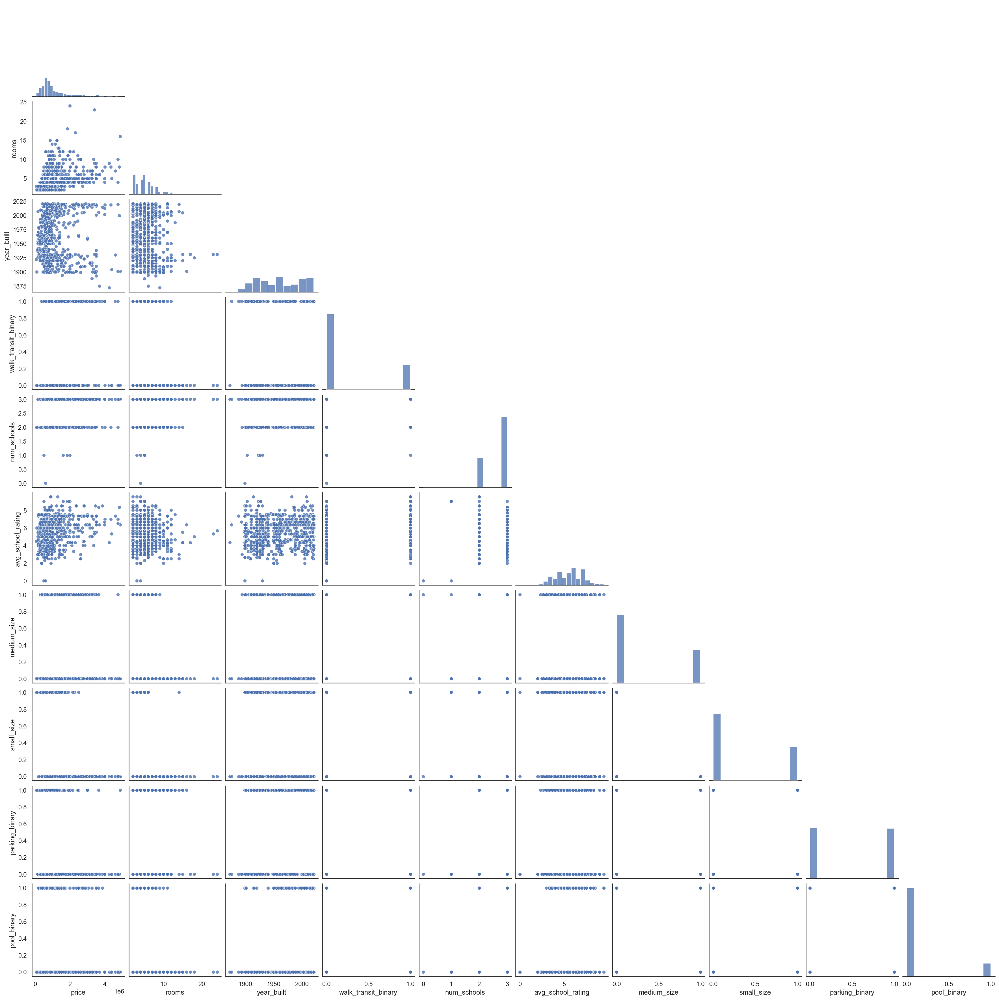

In [458]:
# Repeat pairplot for baseline model (no area, no property type)
sns.set(rc={"figure.figsize": (40,40)})
sns.set_style("white")
sns.pairplot(combined_listings, vars=['price', 'rooms', 'year_built','walk_transit_binary', 'num_schools', 'avg_school_rating',
                                                                   'medium_size','small_size','parking_binary', 'pool_binary'],plot_kws={'alpha':0.8},corner=True);

In [625]:
# Define feature and target for LESS CONSERVATIVE approach to outliers
features_ = combined_listings.loc[:,['rooms', 'year_built','walk_transit_binary', 'num_schools', 'avg_school_rating',
                                    'medium_size','small_size','parking_binary', 'pool_binary','Condominium',
                                    'Cooperative','Multi Family','Single Family','Stock Cooperative',
                                    'Two Family','Other Property Types','Bensonhurst - Bay Ridge',
                                    'Borough Park', 'Canarsie - Flatlands', 'Central Harlem - Morningside Heights',
                                    'Chelsea - Clinton','Coney Island - Sheepshead Bay','Crotona - Tremont',
                                    'Downtown - Heights - Park Slope','East Flatbush - Flatbush','East New York',
                                    'Fordham - Bronx Park','Gramercy Park - Murray Hill','Greenpoint',
                                    'Greenwich Village - SoHo','High Bridge - Morrisania','Kingsbridge - Riverdale',
                                    'Lower Manhattan', 'Northeast Bronx','Pelham - Throgs Neck','Port Richmond',
                                    'South Beach - Tottenville','Southeast Queens','Stapleton - St. George','Sunset Park',
                                    'Union Square - Lower East Side','Upper East Side','Upper West Side','Washington Heights - Inwood',
                                    'Williamsburg - Bushwick','Willowbrook']]


target_ = combined_listings['price']

In [626]:
split_and_validate(features_,target_)


Validation R^2 score: 0.6159847492571353
Validation Adjusted R^2 score: 0.4218671499805223
Train R^2 score: 0.7472277169580074
Train Adjusted R^2 score: 0.7241113650297138
Feature coefficients: 

rooms : 70404.71
year_built : -232.98
walk_transit_binary : 6804.76
num_schools : -27321.56
avg_school_rating : 35025.38
medium_size : -35362.09
small_size : -239024.68
parking_binary : -55211.09
pool_binary : 95643.54
Condominium : 145610.17
Cooperative : -132749.57
Multi Family : 25590.15
Single Family : 68363.10
Stock Cooperative : -88903.02
Two Family : 111429.56
Other Property Types : 168914.40
Bensonhurst - Bay Ridge : -130034.99
Borough Park : -36571.08
Canarsie - Flatlands : -444503.81
Central Harlem - Morningside Heights : 41189.00
Chelsea - Clinton : 400542.23
Coney Island - Sheepshead Bay : -247691.87
Crotona - Tremont : -550960.22
Downtown - Heights - Park Slope : 279662.65
East Flatbush - Flatbush : -201855.00
East New York : -124637.13
Fordham - Bronx Park : -483514.86
Gramercy 

The R^2 has improved, but from the pairplot we gather that some outliers in price should be further removed.

#### 7. Variant Model | All features | further outlier removal

In [461]:
combined_listings['price'].describe()

count    7.860000e+02
mean     1.060891e+06
std      8.495508e+05
min      6.000000e+04
25%      5.499000e+05
50%      7.599650e+05
75%      1.275000e+06
max      4.888888e+06
Name: price, dtype: float64

In [463]:
# Investigate outlier in price
combined_listings[combined_listings['price']>2000000]

,listing_id,price,beds,baths,sqft,year_built,walk_score,transit_score,num_schools,avg_school_rating,...,Stock Cooperative,Two Family,Other Property Types,walk_transit_score,walk_transit_score_log,walk_transit_binary,rooms,sqft_categories,medium_size,small_size
224,80012969,3250000.0,2.0,3.0,2025.0,1888,100,100,3,7.333333,...,0,0,0,200,2.301030,1,5.0,large_size,0,0
225,80007267,2695000.0,2.0,2.0,1444.0,2005,100,100,3,7.333333,...,0,0,0,200,2.301030,1,4.0,medium_size,1,0
260,68019269,3250000.0,4.0,3.0,2975.0,1916,99,100,2,5.000000,...,0,0,0,199,2.298853,1,7.0,large_size,0,0
263,65316687,3495000.0,2.0,3.0,2016.0,2001,99,100,3,7.333333,...,0,0,0,199,2.298853,1,5.0,large_size,0,0
268,64697773,2399000.0,3.0,2.0,1655.0,2004,88,82,2,6.000000,...,0,0,0,170,2.230449,0,5.0,medium_size,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
797,2071099101,2350000.0,5.0,3.0,2990.0,1901,99,100,2,8.500000,...,0,0,0,199,2.298853,1,8.0,large_size,0,0
798,2071063223,2500000.0,2.0,4.0,1347.0,2019,99,100,2,5.000000,...,0,0,0,199,2.298853,1,6.0,medium_size,1,0
807,142878443,2300000.0,10.0,7.0,4125.0,1931,93,98,3,4.333333,...,0,0,0,191,2.281033,0,17.0,large_size,0,0
822,121712381,2750000.0,4.0,4.0,3121.0,2014,95,100,3,4.000000,...,0,0,0,195,2.290035,0,8.0,large_size,0,0


In [469]:
combined_listings = combined_listings[~(combined_listings['price'] >= 2000000)]

In [470]:
combined_listings.shape

(692, 56)

In [627]:
# Define feature and target for LESS CONSERVATIVE approach to outliers
features_ = combined_listings.loc[:,['rooms', 'year_built','walk_transit_binary', 'num_schools', 'avg_school_rating',
                                    'medium_size','small_size','parking_binary', 'pool_binary','Condominium',
                                    'Cooperative','Multi Family','Single Family','Stock Cooperative',
                                    'Two Family','Other Property Types','Bensonhurst - Bay Ridge',
                                    'Borough Park', 'Canarsie - Flatlands', 'Central Harlem - Morningside Heights',
                                    'Chelsea - Clinton','Coney Island - Sheepshead Bay','Crotona - Tremont',
                                    'Downtown - Heights - Park Slope','East Flatbush - Flatbush','East New York',
                                    'Fordham - Bronx Park','Gramercy Park - Murray Hill','Greenpoint',
                                    'Greenwich Village - SoHo','High Bridge - Morrisania','Kingsbridge - Riverdale',
                                    'Lower Manhattan', 'Northeast Bronx','Pelham - Throgs Neck','Port Richmond',
                                    'South Beach - Tottenville','Southeast Queens','Stapleton - St. George','Sunset Park',
                                    'Union Square - Lower East Side','Upper East Side','Upper West Side','Washington Heights - Inwood',
                                    'Williamsburg - Bushwick','Willowbrook']]


target_ = combined_listings['price']

In [628]:
split_and_validate(features_,target_)


Validation R^2 score: 0.6159847492571353
Validation Adjusted R^2 score: 0.4218671499805223
Train R^2 score: 0.7472277169580074
Train Adjusted R^2 score: 0.7241113650297138
Feature coefficients: 

rooms : 70404.71
year_built : -232.98
walk_transit_binary : 6804.76
num_schools : -27321.56
avg_school_rating : 35025.38
medium_size : -35362.09
small_size : -239024.68
parking_binary : -55211.09
pool_binary : 95643.54
Condominium : 145610.17
Cooperative : -132749.57
Multi Family : 25590.15
Single Family : 68363.10
Stock Cooperative : -88903.02
Two Family : 111429.56
Other Property Types : 168914.40
Bensonhurst - Bay Ridge : -130034.99
Borough Park : -36571.08
Canarsie - Flatlands : -444503.81
Central Harlem - Morningside Heights : 41189.00
Chelsea - Clinton : 400542.23
Coney Island - Sheepshead Bay : -247691.87
Crotona - Tremont : -550960.22
Downtown - Heights - Park Slope : 279662.65
East Flatbush - Flatbush : -201855.00
East New York : -124637.13
Fordham - Bronx Park : -483514.86
Gramercy 

The R^2 improved significantly.

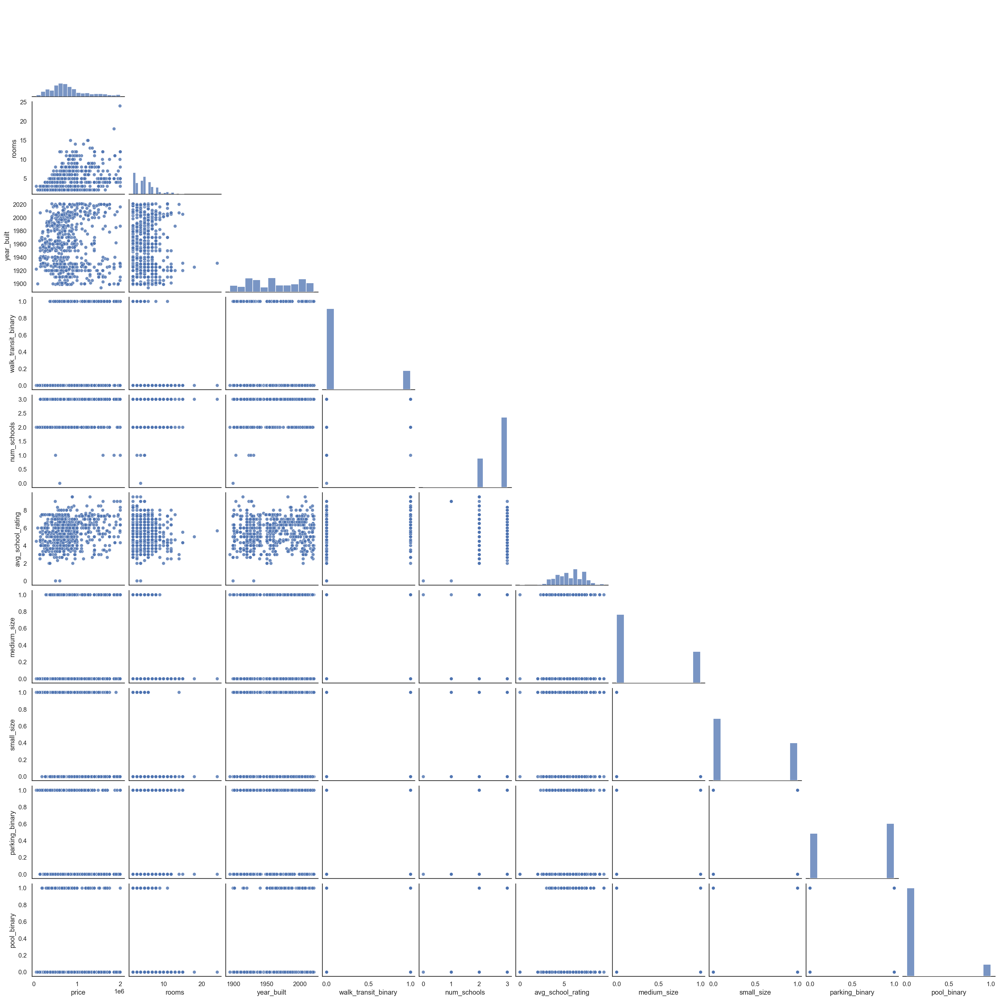

In [473]:
# Repeat pairplot
sns.set(rc={"figure.figsize": (40,40)})
sns.set_style("white")
sns.pairplot(combined_listings, vars=['price', 'rooms', 'year_built','walk_transit_binary', 'num_schools', 'avg_school_rating',
                                                                   'medium_size','small_size','parking_binary', 'pool_binary'],plot_kws={'alpha':0.8},corner=True);

There are two outliers in room, which we need to eliminate.

In [477]:
combined_listings[combined_listings['rooms'] >= 18]

,listing_id,price,beds,baths,sqft,year_built,walk_score,transit_score,num_schools,avg_school_rating,...,Stock Cooperative,Two Family,Other Property Types,walk_transit_score,walk_transit_score_log,walk_transit_binary,rooms,sqft_categories,medium_size,small_size
82,30749818,1850000.0,12.0,6.0,5000.0,1925,80,59,3,5.000000,...,0,0,0,139,2.143015,0,18.0,large_size,0,0
772,2071168942,1990000.0,16.0,8.0,6344.0,1931,96,98,3,5.666667,...,0,0,0,194,2.287802,0,24.0,large_size,0,0


In [478]:
combined_listings = combined_listings[~(combined_listings['rooms'] >= 18)]

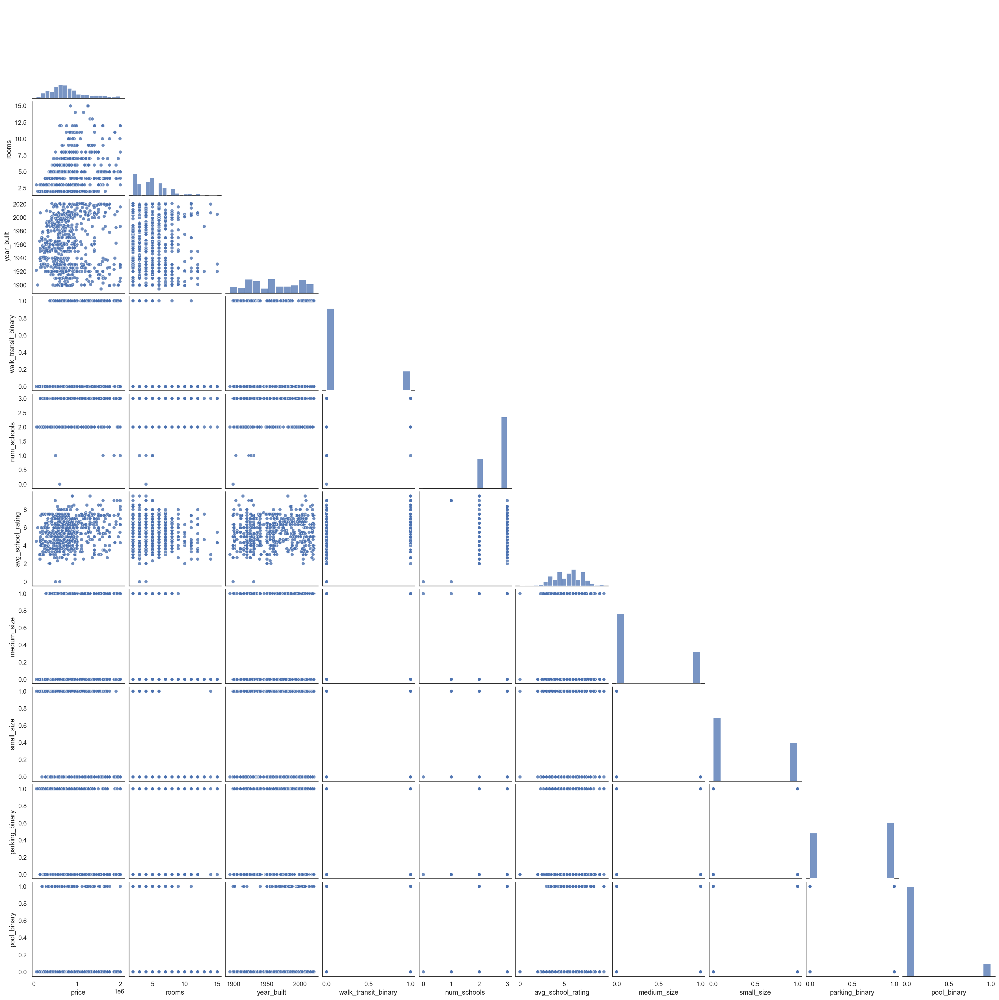

In [480]:
# Repeat pairplot
sns.set(rc={"figure.figsize": (40,40)})
sns.set_style("white")
sns.pairplot(combined_listings, vars=['price', 'rooms', 'year_built','walk_transit_binary', 'num_schools', 'avg_school_rating',
                                                                   'medium_size','small_size','parking_binary', 'pool_binary'],plot_kws={'alpha':0.8},corner=True);

In [629]:
features_ = combined_listings.loc[:,['rooms', 'year_built','walk_transit_binary', 'num_schools', 'avg_school_rating',
                                    'medium_size','small_size','parking_binary', 'pool_binary','Condominium',
                                    'Cooperative','Multi Family','Single Family','Stock Cooperative',
                                    'Two Family','Other Property Types','Bensonhurst - Bay Ridge',
                                    'Borough Park', 'Canarsie - Flatlands', 'Central Harlem - Morningside Heights',
                                    'Chelsea - Clinton','Coney Island - Sheepshead Bay','Crotona - Tremont',
                                    'Downtown - Heights - Park Slope','East Flatbush - Flatbush','East New York',
                                    'Fordham - Bronx Park','Gramercy Park - Murray Hill','Greenpoint',
                                    'Greenwich Village - SoHo','High Bridge - Morrisania','Kingsbridge - Riverdale',
                                    'Lower Manhattan', 'Northeast Bronx','Pelham - Throgs Neck','Port Richmond',
                                    'South Beach - Tottenville','Southeast Queens','Stapleton - St. George','Sunset Park',
                                    'Union Square - Lower East Side','Upper East Side','Upper West Side','Washington Heights - Inwood',
                                    'Williamsburg - Bushwick','Willowbrook']]


target_ = combined_listings['price']

In [630]:
split_and_validate(features_,target_)


Validation R^2 score: 0.6159847492571353
Validation Adjusted R^2 score: 0.4218671499805223
Train R^2 score: 0.7472277169580074
Train Adjusted R^2 score: 0.7241113650297138
Feature coefficients: 

rooms : 70404.71
year_built : -232.98
walk_transit_binary : 6804.76
num_schools : -27321.56
avg_school_rating : 35025.38
medium_size : -35362.09
small_size : -239024.68
parking_binary : -55211.09
pool_binary : 95643.54
Condominium : 145610.17
Cooperative : -132749.57
Multi Family : 25590.15
Single Family : 68363.10
Stock Cooperative : -88903.02
Two Family : 111429.56
Other Property Types : 168914.40
Bensonhurst - Bay Ridge : -130034.99
Borough Park : -36571.08
Canarsie - Flatlands : -444503.81
Central Harlem - Morningside Heights : 41189.00
Chelsea - Clinton : 400542.23
Coney Island - Sheepshead Bay : -247691.87
Crotona - Tremont : -550960.22
Downtown - Heights - Park Slope : 279662.65
East Flatbush - Flatbush : -201855.00
East New York : -124637.13
Fordham - Bronx Park : -483514.86
Gramercy 

#### 8. Variant Model | All features | access to education

The coefficient on number of schools is not aligned with our assumptions. Technically, the more schools in a neighbourhood the more the listing price will increase. The inconsistent coefficient is likely due to the fact that number of schools is capped at 3 and has only a few instances where it is one (this is part of the UI of Zillow, so it's an issue intrinsic to the dataset and data gathering part). Test:
- Feature engineering: **school_quality = num_schools * avg_school_rating**
- Drop num_schools

In [493]:
combined_listings[combined_listings['avg_school_rating']<1]

,listing_id,price,beds,baths,sqft,year_built,walk_score,transit_score,num_schools,avg_school_rating,...,Two Family,Other Property Types,walk_transit_score,walk_transit_score_log,walk_transit_binary,rooms,sqft_categories,medium_size,small_size,school_quality
216,83043370,499000.0,2.0,1.0,537.0,1930,94,95,1,0.0,...,0,0,189,2.276462,0,3.0,small_size,0,1,0.0
300,32373405,599000.0,2.0,2.0,1356.0,1899,39,39,0,0.0,...,0,0,78,1.892095,0,4.0,medium_size,1,0,0.0


In [495]:
# Drop avg_school_rating outliers
combined_listings = combined_listings[~(combined_listings['avg_school_rating'] == 0)]

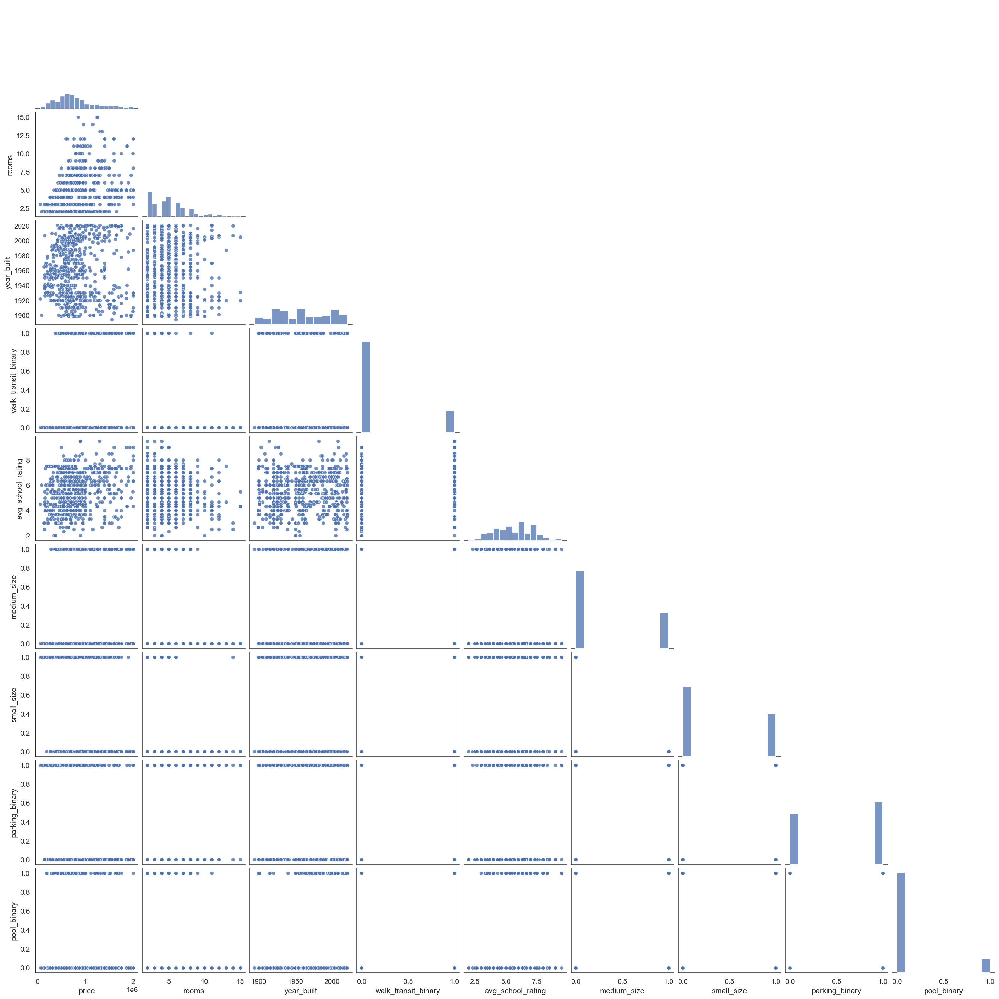

In [496]:
# Repeat pairplot
sns.set(rc={"figure.figsize": (40,40)})
sns.set_style("white")
sns.pairplot(combined_listings, vars=['price', 'rooms', 'year_built','walk_transit_binary', 'avg_school_rating',
                                        'medium_size','small_size','parking_binary', 'pool_binary'],plot_kws={'alpha':0.8},corner=True);

In [483]:
# Create school_quality
combined_listings['school_quality'] = combined_listings['num_schools'] * combined_listings['avg_school_rating']

In [631]:
# Substitute avg_school_rating and num_schools with school_quality to represent access to education in the listing's area
features_ = combined_listings.loc[:,['rooms', 'year_built','walk_transit_binary', 'school_quality',
                                    'medium_size','small_size','parking_binary', 'pool_binary','Condominium',
                                    'Cooperative','Multi Family','Single Family','Stock Cooperative',
                                    'Two Family','Other Property Types','Bensonhurst - Bay Ridge',
                                    'Borough Park', 'Canarsie - Flatlands', 'Central Harlem - Morningside Heights',
                                    'Chelsea - Clinton','Coney Island - Sheepshead Bay','Crotona - Tremont',
                                    'Downtown - Heights - Park Slope','East Flatbush - Flatbush','East New York',
                                    'Fordham - Bronx Park','Gramercy Park - Murray Hill','Greenpoint',
                                    'Greenwich Village - SoHo','High Bridge - Morrisania','Kingsbridge - Riverdale',
                                    'Lower Manhattan', 'Northeast Bronx','Pelham - Throgs Neck','Port Richmond',
                                    'South Beach - Tottenville','Southeast Queens','Stapleton - St. George','Sunset Park',
                                    'Union Square - Lower East Side','Upper East Side','Upper West Side','Washington Heights - Inwood',
                                    'Williamsburg - Bushwick','Willowbrook']]


target_ = combined_listings['price']

In [632]:
split_and_validate(features_,target_)


Validation R^2 score: 0.6114708158585558
Validation Adjusted R^2 score: 0.4214293670937189
Train R^2 score: 0.7413396930461931
Train Adjusted R^2 score: 0.7182450227824604
Feature coefficients: 

rooms : 70615.80
year_built : -258.25
walk_transit_binary : 7544.64
school_quality : 6013.32
medium_size : -35994.07
small_size : -247591.55
parking_binary : -47898.43
pool_binary : 91175.31
Condominium : 148256.68
Cooperative : -131289.81
Multi Family : 8440.36
Single Family : 54728.84
Stock Cooperative : -94937.48
Two Family : 101290.08
Other Property Types : 166458.75
Bensonhurst - Bay Ridge : -81015.83
Borough Park : -52093.42
Canarsie - Flatlands : -472638.32
Central Harlem - Morningside Heights : 50998.81
Chelsea - Clinton : 396943.75
Coney Island - Sheepshead Bay : -224828.20
Crotona - Tremont : -548018.15
Downtown - Heights - Park Slope : 300483.83
East Flatbush - Flatbush : -199251.81
East New York : -117686.35
Fordham - Bronx Park : -489223.54
Gramercy Park - Murray Hill : 172764.48

R^2 drops to 0.61 but school_quality presents the expected (positive) coefficient.

In [633]:
# Substitute avg_school_rating and num_schools with school_quality to represent access to education in the listing's area# 
features_ = combined_listings.loc[:,['rooms', 'year_built','walk_transit_binary', 'avg_school_rating',
                                    'medium_size','small_size','parking_binary', 'pool_binary','Condominium',
                                    'Cooperative','Multi Family','Single Family','Stock Cooperative',
                                    'Two Family','Other Property Types','Bensonhurst - Bay Ridge',
                                    'Borough Park', 'Canarsie - Flatlands', 'Central Harlem - Morningside Heights',
                                    'Chelsea - Clinton','Coney Island - Sheepshead Bay','Crotona - Tremont',
                                    'Downtown - Heights - Park Slope','East Flatbush - Flatbush','East New York',
                                    'Fordham - Bronx Park','Gramercy Park - Murray Hill','Greenpoint',
                                    'Greenwich Village - SoHo','High Bridge - Morrisania','Kingsbridge - Riverdale',
                                    'Lower Manhattan', 'Northeast Bronx','Pelham - Throgs Neck','Port Richmond',
                                    'South Beach - Tottenville','Southeast Queens','Stapleton - St. George','Sunset Park',
                                    'Union Square - Lower East Side','Upper East Side','Upper West Side','Washington Heights - Inwood',
                                    'Williamsburg - Bushwick','Willowbrook']]


target_ = combined_listings['price']

In [634]:
split_and_validate(features_,target_)


Validation R^2 score: 0.6163507056031488
Validation Adjusted R^2 score: 0.4286961594307759
Train R^2 score: 0.7467264064267578
Train Adjusted R^2 score: 0.7241126927148611
Feature coefficients: 

rooms : 70490.30
year_built : -230.93
walk_transit_binary : 4273.56
avg_school_rating : 35970.52
medium_size : -35781.07
small_size : -240446.99
parking_binary : -54379.32
pool_binary : 93835.53
Condominium : 146123.89
Cooperative : -131231.34
Multi Family : 22542.53
Single Family : 63099.04
Stock Cooperative : -87758.21
Two Family : 105517.83
Other Property Types : 166898.60
Bensonhurst - Bay Ridge : -128077.58
Borough Park : -47024.51
Canarsie - Flatlands : -457141.61
Central Harlem - Morningside Heights : 54747.81
Chelsea - Clinton : 386567.02
Coney Island - Sheepshead Bay : -247532.76
Crotona - Tremont : -546073.98
Downtown - Heights - Park Slope : 279946.13
East Flatbush - Flatbush : -206472.05
East New York : -122260.52
Fordham - Bronx Park : -483122.25
Gramercy Park - Murray Hill : 158

The R^2 drops from the case where both num_schools and avg_school_ratings were included, but it decreases **less** than when school_quality is introduced in the regression. 
Therefore, we are caught in a conundrum that is pretty common when running Linear Regression with both a predictability and interpretability goals:
- Best model for prediction: include num_school and avg_school_rating
- Best model for interpretation: include avg_school_rating only

Since, knowing the dataset, I know that the number of schools is not representative of the *actual* number of schools in a certain radius (capped to 3 for Zillow UI purposes), I have decided to choose the best model for interpretation and move forward.

#### Check for interation terms

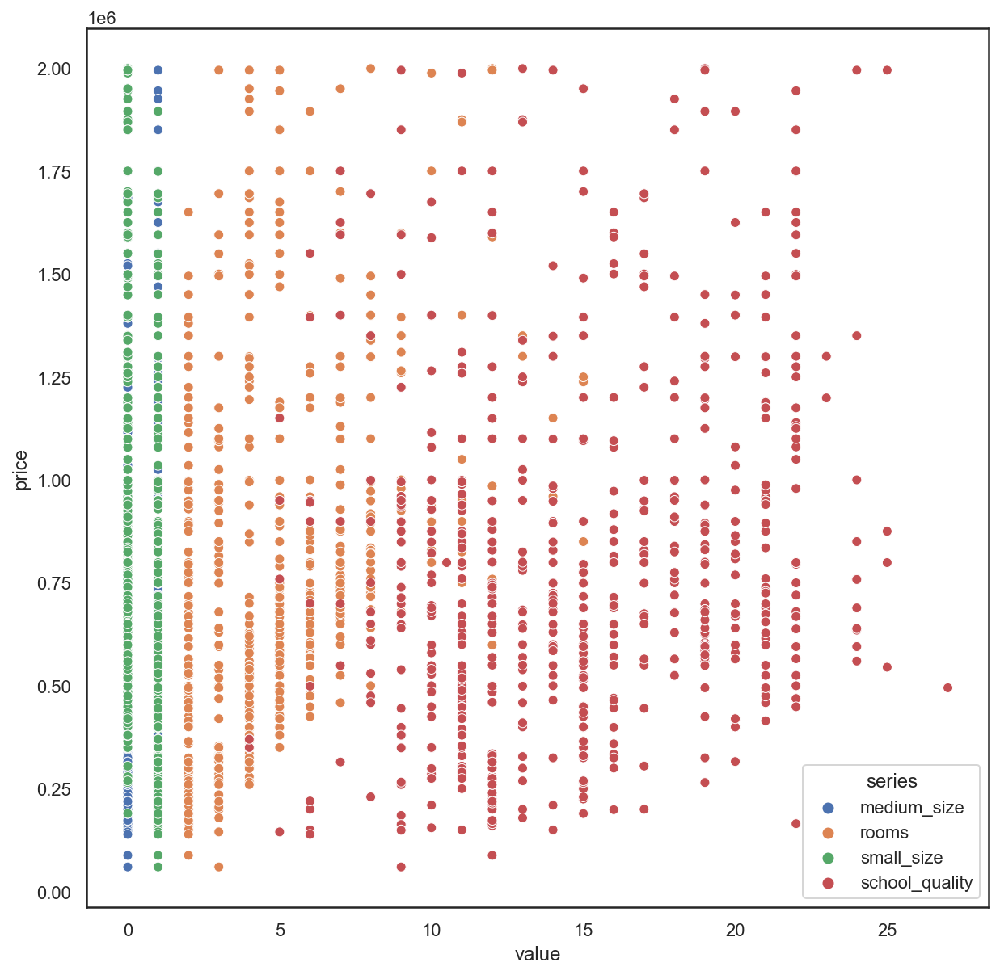

In [518]:
# Plot different features against the target to look for patterns
sns.set(rc={"figure.figsize": (10,10)})
sns.set_style("white")
sns.scatterplot(x='value', hue='series', y='price',
                data=combined_listings.melt(value_vars=['medium_size', 'rooms','small_size','school_quality'], 
                id_vars='price',
                var_name='series'));

There does not seem to be a specific pattern in the visualization above. Hence, there is probably no need for including an interaction term. 

#### 9. Variant Model | Model 8 | No area

In [635]:
# Substitute avg_school_rating and num_schools with school_quality to represent access to education in the listing's area# 
features_ = combined_listings.loc[:,['rooms', 'year_built','walk_transit_binary', 'avg_school_rating',
                                    'medium_size','small_size','parking_binary', 'pool_binary','Condominium',
                                    'Cooperative','Multi Family','Single Family','Stock Cooperative',
                                    'Two Family','Other Property Types']]


target_ = combined_listings['price']

In [636]:
split_and_validate(features_,target_)


Validation R^2 score: 0.5924040679786131
Validation Adjusted R^2 score: 0.5422898140415573
Train R^2 score: 0.5851679515314245
Train Adjusted R^2 score: 0.5735153659002847
Feature coefficients: 

rooms : 68396.12
year_built : -921.43
walk_transit_binary : 377425.43
avg_school_rating : 37142.35
medium_size : -51909.95
small_size : -314501.44
parking_binary : -93592.18
pool_binary : 50101.47
Condominium : 366753.25
Cooperative : -19084.27
Multi Family : -50145.47
Single Family : -67044.02
Stock Cooperative : -128942.02
Two Family : -59840.90
Other Property Types : 97195.77


Adjusted R^2 improves significantly from the previous iteration. We'll probably need to apply feature engineering to the area features.

#### 10. Variant Model | Model 8 | No area, no property type

In [637]:
# Substitute avg_school_rating and num_schools with school_quality to represent access to education in the listing's area# 
features_ = combined_listings.loc[:,['rooms', 'year_built','walk_transit_binary', 'avg_school_rating',
                                    'medium_size','small_size','parking_binary', 'pool_binary']]


target_ = combined_listings['price']

In [638]:
split_and_validate(features_,target_)


Validation R^2 score: 0.5205113607638889
Validation Adjusted R^2 score: 0.4907756311988588
Train R^2 score: 0.481579142910301
Train Adjusted R^2 score: 0.4739130304209893
Feature coefficients: 

rooms : 70220.75
year_built : 480.93
walk_transit_binary : 482334.57
avg_school_rating : 35011.71
medium_size : 666.66
small_size : -194825.87
parking_binary : -189023.80
pool_binary : 77980.15


The R^2 is negatively impacted by the elimination of property type variables. I will keep those variable in the final version of the model.  

#### 11. Variant Model | Model 8 | Boroughs

Area needs to be manipulated in order to be informative for the model. I will try to represent area by a higher level of aggregration (borough).

In [523]:
# Import csv
borough_df = pd.read_csv('/Users/valentinarizzati/Desktop/borough.csv')

In [525]:
borough_df.shape

(42, 2)

In [528]:
borough_df.columns

Index(['Neighborhood', 'Borough'], dtype='object')

In [531]:
manhattan_mask = borough_df[borough_df['Borough']=='Manhattan']

In [532]:
manhattan_mask

,Neighborhood,Borough
18,Washington Heights - Inwood,Manhattan
19,Central Harlem - Morningside Heights,Manhattan
20,East Harlem,Manhattan
21,Upper West Side,Manhattan
22,Upper East Side,Manhattan
23,Chelsea - Clinton,Manhattan
24,Gramercy Park - Murray Hill,Manhattan
25,Greenwich Village - SoHo,Manhattan
26,Union Square - Lower East Side,Manhattan
27,Lower Manhattan,Manhattan


In [534]:
 manhattan_mask['Neighborhood'].tolist()

['Washington Heights - Inwood',
 'Central Harlem - Morningside Heights',
 'East Harlem',
 'Upper West Side',
 'Upper East Side',
 'Chelsea - Clinton',
 'Gramercy Park - Murray Hill',
 'Greenwich Village - SoHo',
 'Union Square - Lower East Side',
 'Lower Manhattan']

In [552]:
combined_listings['East Harlem'].value_counts() # no column east harlem (no listings in east harlem)

KeyError: 'East Harlem'

In [553]:
# Create a new column mapping all the neighbourhoods in Manhattan
manhattan_conditions = [
    combined_listings['Washington Heights - Inwood'] == 1,
    combined_listings['Central Harlem - Morningside Heights'] == 1,
    combined_listings['Upper West Side'] == 1,
    combined_listings['Upper East Side'] == 1,
    combined_listings['Chelsea - Clinton'] == 1,
    combined_listings['Gramercy Park - Murray Hill'] == 1,
    combined_listings['Greenwich Village - SoHo'] == 1,
    combined_listings['Union Square - Lower East Side'] == 1,
    combined_listings['Lower Manhattan'] == 1,
]

# Create outputs for feature engineering on property type
manhattan_outputs = [1,1,1,1,1,1,1,1,1]

# Create new column 'Other Property Types'
combined_listings['Manhattan'] = np.select(manhattan_conditions, manhattan_outputs, 0)

In [554]:
brooklyn_mask = borough_df[borough_df['Borough']=='Brooklyn']

In [555]:
brooklyn_mask['Neighborhood'].tolist()

['Greenpoint',
 'Downtown - Heights - Park Slope',
 'Bedford Stuyvesant - Crown Heights',
 'East New York',
 'Sunset Park',
 'Borough Park',
 'East Flatbush - Flatbush',
 'Canarsie - Flatlands',
 'Bensonhurst - Bay Ridge',
 'Coney Island - Sheepshead Bay',
 'Williamsburg - Bushwick']

In [559]:
# Create a new column mapping all the neighbourhoods in Brooklyn
brooklyn_conditions = [
    combined_listings['Greenpoint'] == 1,
    combined_listings['Downtown - Heights - Park Slope'] == 1,
    combined_listings['East New York'] == 1,
    combined_listings['Sunset Park'] == 1,
    combined_listings['Borough Park'] == 1,
    combined_listings['East Flatbush - Flatbush'] == 1,
    combined_listings['Canarsie - Flatlands'] == 1,
    combined_listings['Bensonhurst - Bay Ridge'] == 1,
    combined_listings['Coney Island - Sheepshead Bay'] == 1,
    combined_listings['Williamsburg - Bushwick'] == 1
]

# Create outputs for feature engineering on property type
brooklyn_outputs = [1,1,1,1,1,1,1,1,1,1]

# Create new column 'Other Property Types'
combined_listings['Brooklyn'] = np.select(brooklyn_conditions, brooklyn_outputs, 0)

In [560]:
queens_mask = borough_df[borough_df['Borough']=='Queens']

In [561]:
queens_mask['Neighborhood'].tolist()

['Long Island City - Astoria',
 'West Queens',
 'Flushing - Clearview',
 'Bayside - Little Neck',
 'Ridgewood - Forest Hills',
 'Fresh Meadows',
 'Southwest Queens',
 'Jamaica',
 'Southeast Queens',
 'Rockaway']

In [572]:
# Create a new column mapping all the neighbourhoods in Queens
queens_conditions = [
    combined_listings['Southeast Queens'] == 1,
]

# Create outputs for feature engineering on property type
queens_outputs = [1]

# Create new column 'Other Property Types'
combined_listings['Queens'] = np.select(queens_conditions, queens_outputs, 0)

In [573]:
bronx_mask = borough_df[borough_df['Borough']=='Bronx']

In [574]:
bronx_mask['Neighborhood'].tolist()

['Kingsbridge - Riverdale',
 'Northeast Bronx',
 'Fordham - Bronx Park',
 'Pelham - Throgs Neck',
 'Crotona - Tremont',
 'High Bridge - Morrisania',
 'Hunts Point - Mott Haven']

In [576]:
# Create a new column mapping all the neighbourhoods in the Bronx
bronx_conditions = [
    combined_listings['Kingsbridge - Riverdale'] == 1,
    combined_listings['Northeast Bronx'] == 1,
    combined_listings['Fordham - Bronx Park'] == 1,
    combined_listings['Pelham - Throgs Neck'] == 1,
    combined_listings['Crotona - Tremont'] == 1,
    combined_listings['High Bridge - Morrisania'] == 1,
]

# Create outputs for feature engineering on property type
bronx_outputs = [1,1,1,1,1,1]

# Create new column 'Other Property Types'
combined_listings['Bronx'] = np.select(bronx_conditions, bronx_outputs, 0)

In [639]:
# Rerun the model 
features_ = combined_listings.loc[:,['rooms', 'year_built','walk_transit_binary', 'avg_school_rating',
                                    'medium_size','small_size','parking_binary', 'pool_binary','Condominium',
                                    'Cooperative','Multi Family','Single Family','Stock Cooperative',
                                    'Two Family','Other Property Types','Bronx','Brooklyn','Manhattan','Queens']]


target_ = combined_listings['price']

In [640]:
split_and_validate(features_,target_)


Validation R^2 score: 0.6407092639741969
Validation Adjusted R^2 score: 0.5828573658005507
Train R^2 score: 0.6618791537843649
Train Adjusted R^2 score: 0.6497578404294648
Feature coefficients: 

rooms : 70254.56
year_built : -628.26
walk_transit_binary : 223431.31
avg_school_rating : 27329.28
medium_size : -46443.16
small_size : -292989.04
parking_binary : -49121.74
pool_binary : 60028.86
Condominium : 337929.49
Cooperative : 12182.57
Multi Family : 59389.90
Single Family : 11922.26
Stock Cooperative : 20238.19
Two Family : 27307.96
Other Property Types : 182626.29
Bronx : -106000.73
Brooklyn : 231940.39
Manhattan : 303548.81
Queens : 208027.36


#### 12. Variant Model | No Property Type | Boroughs

In [643]:
# Rerun the model 
features_ = combined_listings.loc[:,['rooms', 'walk_transit_binary', 'avg_school_rating',
                                    'medium_size','small_size', 'pool_binary','parking_binary',
                                    'Bronx','Brooklyn','Manhattan','Queens','year_built']]


target_ = combined_listings['price']

In [644]:
split_and_validate(features_,target_)


Validation R^2 score: 0.6081328612884928
Validation Adjusted R^2 score: 0.5705136159721881
Train R^2 score: 0.6039750897838181
Train Adjusted R^2 score: 0.5951253711197693
Feature coefficients: 

rooms : 77374.57
walk_transit_binary : 276191.00
avg_school_rating : 22683.49
medium_size : 528.42
small_size : -198446.79
pool_binary : 83974.65
parking_binary : -79612.05
Bronx : -59325.51
Brooklyn : 341256.93
Manhattan : 391033.88
Queens : 197371.06
year_built : 546.87


#### Model Selection

These 12 rounds of testing yielded the following results:
- **Baseline Model** | Val R^2 = 0.3201 | Val Adj R^2 = 0.2610
- **Model 7** (outlier removal) | Val R^2 = 0.6160 | Val Adj R^2 = 0.4219
- **Model 8** (num_schools removal) | Val R^2 = 0.6164 | Val Adj R^2 = 0.4290
- **Model 9** (area features removal) | Val R^2 = 0.5924 | Val Adj R^2 = 0.5423
- **Model 10** (property type and area features removal) | Val R^2 = 0.5205 | Val Adj R^2 = 0.4908
- **Model 11** (area features as boroughs) | Val R^2 = 0.6407 | Val Adj R^2 = 0.5829

-----

**Model 11 will be my model of choice** as it is the best model to satisfy both my goals of predictability and interpretation. Also, it seems like this model is characterized by a relatively good fit because the R^2 of the validation set is reasonably close to the R^2 of the training set.

-----

### Cross Validation and Ridge Regularization

In [685]:
# From model 11 (model of choice)
X, y = combined_listings.loc[:,['rooms', 'year_built','walk_transit_binary', 'avg_school_rating',
                                    'medium_size','small_size','parking_binary', 'pool_binary','Condominium',
                                    'Cooperative','Multi Family','Single Family','Stock Cooperative',
                                    'Two Family','Other Property Types','Bronx','Brooklyn','Manhattan','Queens']], combined_listings['price']

X, X_test, y, y_test = train_test_split(X, y, test_size=.2, random_state=42) #hold out 20% of the data for final testing

X, y = np.array(X), np.array(y)

In [686]:
# Run the cv
kf = KFold(n_splits=5, shuffle=True, random_state = 42) 
cv_lm_r2s, cv_lm_reg_r2s = [], [] #collect the validation results for both models

for train_ind, val_ind in kf.split(X,y):
    
    X_train, y_train = X[train_ind], y[train_ind]
    X_val, y_val = X[val_ind], y[val_ind] 
    
    #compare linear regression and ridge regularization
    lm = LinearRegression()
    lm_reg = Ridge(alpha=1)

    lm.fit(X_train, y_train)
    cv_lm_r2s.append(lm.score(X_val, y_val).round(3))
    
    #ridge with feature scaling
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)
    
    lm_reg.fit(X_train_scaled, y_train)
    cv_lm_reg_r2s.append(lm_reg.score(X_val_scaled, y_val).round(3))

print(f'Simple scores: \t{cv_lm_r2s}')
print(f'Ridge scores: \t{cv_lm_reg_r2s} \n')

print(f'Simple mean cv r^2: {np.mean(cv_lm_r2s):.3f} +- {np.std(cv_lm_r2s):.3f}')
print(f'Ridge mean cv r^2: {np.mean(cv_lm_reg_r2s):.3f} +- {np.std(cv_lm_reg_r2s):.3f}')

Simple scores: 	[0.63, 0.601, 0.657, 0.662, 0.607]
Ridge scores: 	[0.63, 0.602, 0.657, 0.662, 0.607] 

Simple mean cv r^2: 0.631 +- 0.025
Ridge mean cv r^2: 0.632 +- 0.025


-----

**The Linear Regression form of Model 11 will be my model of choice** as regularization does not impact the R^2 and the coefficients will be more interpretable with Linear Regression. Also, the R^2 in the 5 folds of the validation scheme are pretty stable, indicating that the data is not suffering from overfitting.

-----

In [687]:
lm.coef_

array([  71409.98384557,    -885.29086803,  228104.71050263,
         30929.64893222,  -47043.30706716, -272664.2745969 ,
        -57623.6282569 ,   55046.01911127,  389065.52255463,
         24936.96169057,  107737.27169735,   47716.21611893,
         52818.66734002,   66521.32118887,  214838.67036136,
       -111244.519889  ,  195022.94423618,  249370.6406484 ,
        207040.60977593])

In [688]:
lm.intercept_

1911670.0415099054

In [690]:
# Print final version of coefficients
print('Intercept: ',lm.intercept_)
for feature, coef in zip(combined_listings.loc[:,['rooms', 'year_built','walk_transit_binary', 'avg_school_rating',
                                    'medium_size','small_size','parking_binary', 'pool_binary','Condominium',
                                    'Cooperative','Multi Family','Single Family','Stock Cooperative',
                                    'Two Family','Other Property Types','Bronx','Brooklyn','Manhattan','Queens']], lm.coef_):
    
    print(feature, ':', f'{coef:.2f}')

Intercept:  1911670.0415099054
rooms : 71409.98
year_built : -885.29
walk_transit_binary : 228104.71
avg_school_rating : 30929.65
medium_size : -47043.31
small_size : -272664.27
parking_binary : -57623.63
pool_binary : 55046.02
Condominium : 389065.52
Cooperative : 24936.96
Multi Family : 107737.27
Single Family : 47716.22
Stock Cooperative : 52818.67
Two Family : 66521.32
Other Property Types : 214838.67
Bronx : -111244.52
Brooklyn : 195022.94
Manhattan : 249370.64
Queens : 207040.61


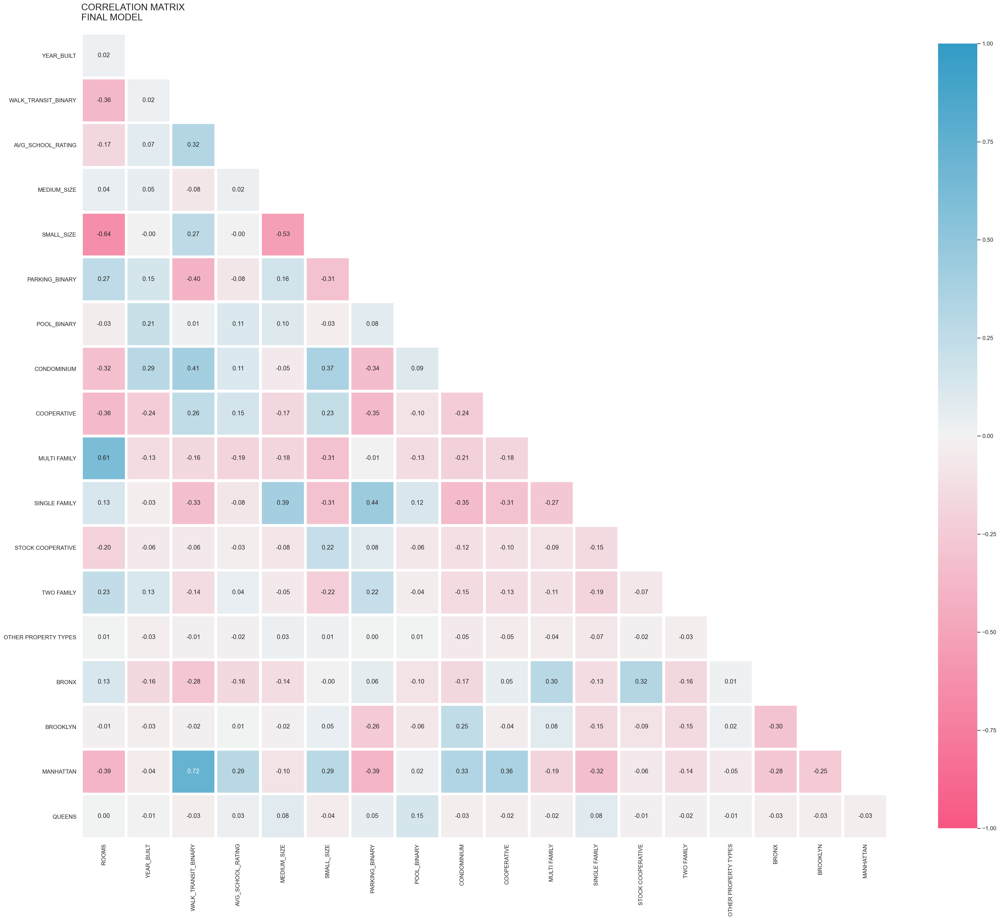

In [724]:
# Create correlation matrix of full dataframe
combined_listings_final = combined_listings.loc[:,['rooms', 'year_built','walk_transit_binary', 'avg_school_rating',
                                    'medium_size','small_size','parking_binary', 'pool_binary','Condominium',
                                    'Cooperative','Multi Family','Single Family','Stock Cooperative',
                                    'Two Family','Other Property Types','Bronx','Brooklyn','Manhattan','Queens']]

# correlation df
corr_final_df = combined_listings_final.corr()

# mask
mask = np.triu(np.ones_like(corr_final_df, dtype=np.bool))

# adjust mask and df
mask = mask[1:, :-1]
corr = corr_final_df.iloc[1:,:-1].copy()

# color map
cmap = sns.diverging_palette(0, 230, 90, 60, as_cmap=True)

# plot heatmap
sns.set(rc={"figure.figsize": (35,35)})
sns.set_style("white")
house_corr_matrix = sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", 
                                linewidths=5, cmap=cmap, vmin=-1, vmax=1, 
                                cbar_kws={"shrink": .8}, square=True)

# ticks
yticks = [i.upper() for i in corr.index]
xticks = [i.upper() for i in corr.columns];

plt.yticks(plt.yticks()[0], labels=yticks, rotation=0)
plt.xticks(plt.xticks()[0], labels=xticks)

# title
title = 'CORRELATION MATRIX\nFINAL MODEL\n'
plt.title(title, loc='left', fontsize=18)

# save image
fig = house_corr_matrix.get_figure()
fig.savefig("/Users/valentinarizzati/Desktop/images/corr_matrix_final.png");

### Generate predictions and evaluate residuals

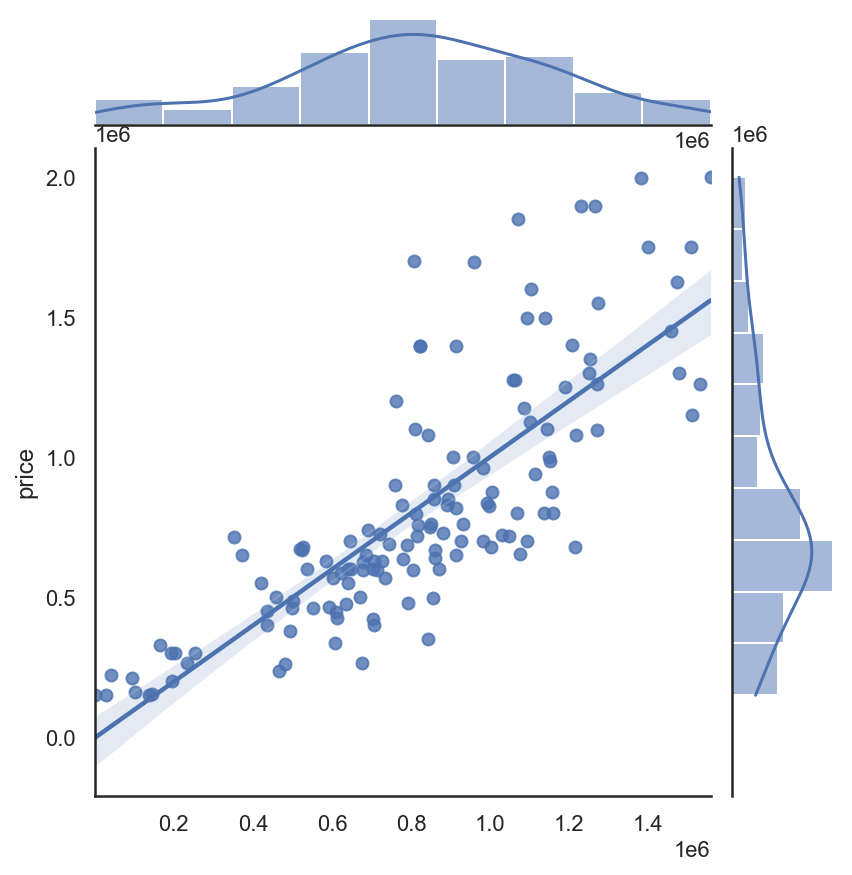

In [720]:
# Compute prediction, residuals and visualize
y_pred = lm.predict(X_test)
residuals = y_test-y_pred
jointplot_final = sns.jointplot(x=y_pred,y=y_test, kind='reg')
jointplot_final.savefig("/Users/valentinarizzati/Desktop/images/jointplot_final.png");

From the jointplot above, the model seems to have a pretty good fit with the data.

In [3]:
rmse = mean_squared_error(y_test,y_pred, squared=False)
mae = mean_absolute_error(y_test,y_pred)
print('RMSE: ',rmse)
print('MAE: ',mae)

NameError: name 'y_test' is not defined

As shown by the MSE, the predicted price for a listing tends to be USD 196466 from the actual value. This result is not optimal but it's decent if compared to the magnitude of listing prices in NYC (in the millions). To improve the predictive power of the model, it would be great to investigate other features to include or do some more feature engineering.

In [707]:
R2 =lm.score(X_test,y_test)
adj_R2 = 1 - (1-lm.score(X_test, y_test))*(len(y_test)-1)/(len(y_test)-X_test.shape[1]-1)
print('R^2: ',R2)
print('Adjusted R^2: ',adj_R2)

R^2:  0.6358831497070636
Adjusted R^2:  0.577254165337862


As we saw above, R^2 is pretty decent and certainly the best across all my model iterations.

## Check the residuals

In [716]:
def diagnostic_plots(pred, actual, resid):
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    g1 = sns.regplot(x=y_pred, y=y_test, ci=False, fit_reg=False, line_kws={'color': 'blue'}, ax=axes[0], scatter_kws={'s': 5})
    g1.set_xlabel('Predicted Target')
    g1.set_ylabel('True Target')
    g1.plot(y_test, y_test, '--', color='gray')

    g2 = sns.regplot(x=y_pred, y=residuals, lowess=True, ax=axes[1], line_kws={'color': 'red'}, scatter_kws={'s': 5})
    g2.set_xlabel('Predicted Target')
    g2.set_ylabel('Residual')
    g2.axhline(y=0, color='gray', linestyle='--')

    stats.probplot(residuals, dist="norm", plot=axes[2])

    fig.suptitle('Diagnostic Plots');
    fig.tight_layout();

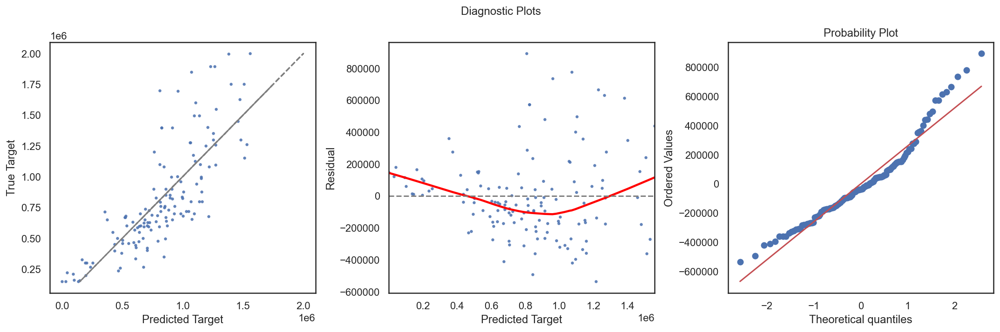

In [722]:
diagnostic_plots(y_pred, y_test, residuals);

This is approximately what we want to see:

1. Left Plot: The points are relatively to the gray line.
2. Middle Plot: The points look random, and the red line is a bit concave but approximating the horizontal direction.
3. Right Plot: The points are relatively close to the red line.

For this first modeling iteration on the Zillow data, I will finalize my recommendations with this linear regression model.